# Simulation 1.1 - Training the agents


## Importing libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter as SGfilter
from IPython.display import clear_output
import datetime
import joblib
from tqdm import tqdm

import const
import utilities as ut
import mockSQLenv as SQLenv
import agent as agn

## Defining the parameters of the simulations

In [2]:
n_simulations = 10
n_episodes_training = 10**6
n_episodes_test = 10**2

exploration_train = 0.1
exploration_test = 0
learningrate = 0.1
discount = 0.9
max_steps = 1000

flag_reward = 10
query_reward = -1

## Running the simulations

In [3]:
train_data = np.zeros((n_simulations,3,n_episodes_training))
test_data = np.zeros((n_simulations,3,n_episodes_test))

for i in tqdm(range(n_simulations)):
    agt = agn.Agent(const.actions,verbose=False)
    agt.set_learning_options(exploration=exploration_train, learningrate=learningrate, discount=discount, max_step = max_steps)
    
    for e in tqdm(range(n_episodes_training)):
        env = SQLenv.mockSQLenv(verbose=False, flag_reward=flag_reward, query_reward=query_reward)

        agt.reset(env)
        agt.run_episode()

        train_data[i,0,e] = agt.steps
        train_data[i,1,e] = agt.rewards
        train_data[i,2,e] = ut.getdictshape(agt.Q)[0]
    
    agt.set_learning_options(exploration=exploration_test)
    
    for e in tqdm(range(n_episodes_test)):
        env = SQLenv.mockSQLenv(verbose=False, flag_reward=flag_reward, query_reward=query_reward)

        agt.reset(env)
        agt.run_episode()

        test_data[i,0,e] = agt.steps
        test_data[i,1,e] = agt.rewards
        test_data[i,2,e] = ut.getdictshape(agt.Q)[0]

  0%|          | 1986/1000000 [00:15<2:25:26, 114.37it/s]


  0%|          | 4193/1000000 [00:31<1:49:50, 151.09it/s]


  1%|          | 6074/1000000 [00:47<2:52:23, 96.09it/s] 


  1%|          | 8122/1000000 [01:03<2:17:49, 119.94it/s]


  1%|          | 10205/1000000 [01:18<2:02:13, 134.98it/s]


  1%|          | 12273/1000000 [01:33<2:04:45, 131.95it/s]


  1%|▏         | 14258/1000000 [01:49<1:45:16, 156.06it/s]


  2%|▏         | 16117/1000000 [02:05<3:18:04, 82.79it/s]


  2%|▏         | 18203/1000000 [02:20<1:41:56, 160.52it/s]


  2%|▏         | 20510/1000000 [02:36<1:34:12, 173.29it/s]


  2%|▏         | 22714/1000000 [02:51<2:02:04, 133.43it/s]


  2%|▏         | 24762/1000000 [03:06<1:48:13, 150.18it/s]


  3%|▎         | 26943/1000000 [03:22<1:56:04, 139.71it/s]


  3%|▎         | 29158/1000000 [03:37<2:07:40, 126.74it/s]


  3%|▎         | 31383/1000000 [03:53<2:01:33, 132.81it/s]


  3%|▎         | 33667/1000000 [04:09<2:06:14, 127.58it/s]


  4%|▎         | 36181/1000000 [04:24<1:25:50, 187.13it/s]


  4%|▍         | 39475/1000000 [04:40<1:12:28, 220.87it/s]


  4%|▍         | 42358/1000000 [04:55<1:21:47, 195.14it/s]


  4%|▍         | 44885/1000000 [05:11<1:47:44, 147.75it/s]


  5%|▍         | 47486/1000000 [05:26<1:32:21, 171.90it/s]


  5%|▌         | 50139/1000000 [05:42<1:06:03, 239.63it/s]


  5%|▌         | 52717/1000000 [05:57<1:20:00, 197.35it/s]


  5%|▌         | 54861/1000000 [06:13<2:19:18, 113.08it/s]


  6%|▌         | 57377/1000000 [06:29<1:48:59, 144.14it/s]


  6%|▌         | 60060/1000000 [06:45<1:31:50, 170.56it/s]


  6%|▋         | 62636/1000000 [07:00<1:11:35, 218.23it/s]


  7%|▋         | 65348/1000000 [07:15<1:33:02, 167.44it/s]


  7%|▋         | 68822/1000000 [07:31<52:09, 297.58it/s]


  7%|▋         | 74277/1000000 [07:47<48:32, 317.83it/s]


  8%|▊         | 80024/1000000 [08:04<47:14, 324.62it/s]


  9%|▊         | 85604/1000000 [08:20<34:36, 440.42it/s]


  9%|▉         | 90712/1000000 [08:36<52:53, 286.48it/s]


 10%|▉         | 96244/1000000 [08:53<46:24, 324.52it/s]


 10%|█         | 101737/1000000 [09:08<52:36, 284.61it/s]


 11%|█         | 107477/1000000 [09:25<57:27, 258.90it/s]


 11%|█▏        | 113077/1000000 [09:40<50:22, 293.44it/s]


 12%|█▏        | 118848/1000000 [09:56<39:00, 376.51it/s]


 12%|█▏        | 124410/1000000 [10:12<38:20, 380.68it/s]


 13%|█▎        | 130168/1000000 [10:28<39:57, 362.81it/s]


 14%|█▎        | 135880/1000000 [10:44<45:06, 319.25it/s]


 14%|█▍        | 141174/1000000 [11:00<46:44, 306.18it/s]


 15%|█▍        | 147133/1000000 [11:16<39:47, 357.27it/s]


 15%|█▌        | 152858/1000000 [11:32<31:12, 452.31it/s]


 16%|█▌        | 158879/1000000 [11:48<47:22, 295.95it/s]


 16%|█▋        | 164740/1000000 [12:03<36:46, 378.54it/s]


 17%|█▋        | 170331/1000000 [12:19<38:52, 355.63it/s]


 18%|█▊        | 175974/1000000 [12:35<40:04, 342.68it/s]


 18%|█▊        | 182223/1000000 [12:51<38:00, 358.63it/s]


 19%|█▉        | 187965/1000000 [13:07<38:52, 348.09it/s]


 19%|█▉        | 193980/1000000 [13:23<37:30, 358.08it/s]


 20%|█▉        | 199951/1000000 [13:39<39:36, 336.62it/s]


 21%|██        | 206829/1000000 [13:55<28:59, 456.10it/s]


 21%|██▏       | 213880/1000000 [14:11<34:50, 375.96it/s]


 22%|██▏       | 220615/1000000 [14:27<24:02, 540.18it/s]


 23%|██▎       | 227322/1000000 [14:43<28:31, 451.54it/s]


 23%|██▎       | 234124/1000000 [14:59<23:56, 533.15it/s]


 24%|██▍       | 240806/1000000 [15:15<29:25, 429.99it/s]


 25%|██▍       | 248633/1000000 [15:31<25:33, 489.91it/s]


 26%|██▌       | 255942/1000000 [15:47<20:07, 616.41it/s]


 26%|██▋       | 263548/1000000 [16:03<20:40, 593.55it/s]


 27%|██▋       | 270940/1000000 [16:18<26:18, 461.86it/s]


 28%|██▊       | 279008/1000000 [16:34<20:48, 577.51it/s]


 29%|██▊       | 287359/1000000 [16:50<22:58, 517.05it/s]


 29%|██▉       | 294807/1000000 [17:06<20:02, 586.49it/s]


 30%|███       | 302634/1000000 [17:22<29:20, 396.19it/s]


 31%|███       | 311023/1000000 [17:38<22:44, 504.78it/s]


 32%|███▏      | 319364/1000000 [17:54<26:04, 435.12it/s]


 33%|███▎      | 328182/1000000 [18:10<28:54, 387.33it/s]


 34%|███▎      | 336148/1000000 [18:25<20:09, 548.91it/s]


 34%|███▍      | 344701/1000000 [18:41<19:22, 563.81it/s]


 35%|███▌      | 354141/1000000 [18:57<15:08, 711.00it/s]


 36%|███▋      | 362900/1000000 [19:13<23:17, 456.02it/s]


 37%|███▋      | 372357/1000000 [19:29<19:41, 531.13it/s]


 38%|███▊      | 381852/1000000 [19:45<21:41, 475.02it/s]


 39%|███▉      | 391166/1000000 [20:00<16:44, 606.06it/s]


 40%|████      | 400476/1000000 [20:16<18:12, 548.62it/s]


 41%|████      | 410485/1000000 [20:32<13:33, 724.63it/s]


 42%|████▏     | 420442/1000000 [20:48<17:27, 553.29it/s]


 43%|████▎     | 429342/1000000 [21:04<16:43, 568.55it/s]


 44%|████▍     | 439256/1000000 [21:19<15:38, 597.70it/s]


 45%|████▍     | 449794/1000000 [21:35<14:53, 615.84it/s]


 46%|████▌     | 459567/1000000 [21:51<16:48, 536.07it/s]


 47%|████▋     | 469455/1000000 [22:07<20:47, 425.34it/s]


 48%|████▊     | 478333/1000000 [22:23<14:01, 619.91it/s]


 49%|████▉     | 488121/1000000 [22:39<16:29, 517.46it/s]


 50%|████▉     | 498706/1000000 [22:54<15:26, 541.06it/s]


 51%|█████     | 508612/1000000 [23:10<13:49, 592.18it/s]


 52%|█████▏    | 518256/1000000 [23:27<15:55, 504.10it/s]


 53%|█████▎    | 528741/1000000 [23:42<09:57, 789.07it/s]


 54%|█████▍    | 538837/1000000 [23:58<11:14, 683.65it/s]


 55%|█████▍    | 549875/1000000 [24:15<15:13, 492.64it/s]


 56%|█████▌    | 561464/1000000 [24:31<10:19, 708.14it/s]


 57%|█████▋    | 570996/1000000 [24:47<09:00, 793.26it/s]


 58%|█████▊    | 580854/1000000 [25:03<11:11, 623.94it/s]


 59%|█████▉    | 591966/1000000 [25:19<11:06, 612.03it/s]


 60%|██████    | 602489/1000000 [25:35<09:40, 685.19it/s]


 61%|██████    | 612448/1000000 [25:50<10:10, 635.07it/s]


 62%|██████▏   | 622850/1000000 [26:06<10:48, 581.99it/s]


 63%|██████▎   | 633452/1000000 [26:22<10:37, 575.36it/s]


 64%|██████▍   | 643327/1000000 [26:38<09:59, 594.90it/s]


 65%|██████▌   | 654484/1000000 [26:54<09:48, 587.43it/s]


 66%|██████▋   | 663161/1000000 [27:10<09:55, 566.06it/s]


 67%|██████▋   | 673208/1000000 [27:26<07:59, 681.30it/s]


 68%|██████▊   | 683297/1000000 [27:42<09:46, 539.70it/s]


 69%|██████▉   | 693904/1000000 [27:58<12:23, 411.74it/s]


 70%|███████   | 704867/1000000 [28:13<05:11, 947.84it/s]


 72%|███████▏  | 717436/1000000 [28:30<05:59, 785.39it/s]


 73%|███████▎  | 728749/1000000 [28:46<06:16, 721.12it/s]


 74%|███████▍  | 739221/1000000 [29:01<05:27, 797.19it/s]


 75%|███████▍  | 749681/1000000 [29:17<06:24, 651.75it/s]


 76%|███████▌  | 760754/1000000 [29:33<06:54, 577.47it/s]


 77%|███████▋  | 771325/1000000 [29:49<05:49, 654.74it/s]


 78%|███████▊  | 783081/1000000 [30:04<06:43, 537.89it/s]


 79%|███████▉  | 793981/1000000 [30:20<06:18, 544.38it/s]


 81%|████████  | 805238/1000000 [30:36<05:06, 635.23it/s]


 82%|████████▏ | 815843/1000000 [30:52<04:21, 703.93it/s]


 83%|████████▎ | 826257/1000000 [31:08<04:13, 686.71it/s]


 84%|████████▎ | 837182/1000000 [31:23<03:50, 705.04it/s]


 85%|████████▍ | 848475/1000000 [31:40<04:13, 596.82it/s]


 86%|████████▌ | 859222/1000000 [31:56<04:15, 550.14it/s]


 87%|████████▋ | 869560/1000000 [32:12<03:12, 676.34it/s]


 88%|████████▊ | 880019/1000000 [32:28<02:37, 760.76it/s]


 89%|████████▉ | 890423/1000000 [32:44<02:44, 665.89it/s]


 90%|█████████ | 900958/1000000 [33:00<02:05, 790.33it/s]


 91%|█████████ | 911763/1000000 [33:16<02:08, 688.72it/s]


 92%|█████████▏| 922907/1000000 [33:32<02:32, 504.23it/s]


 93%|█████████▎| 933679/1000000 [33:47<02:17, 483.55it/s]


 95%|█████████▍| 945089/1000000 [34:03<01:15, 722.66it/s]


 95%|█████████▌| 954916/1000000 [34:19<01:17, 581.32it/s]


 97%|█████████▋| 966398/1000000 [34:35<00:46, 724.94it/s]


 98%|█████████▊| 978091/1000000 [34:51<00:29, 742.46it/s]


 99%|█████████▉| 989640/1000000 [35:07<00:15, 678.91it/s]


100%|██████████| 1000000/1000000 [35:22<00:00, 471.13it/s][A

  0%|          | 41/1000000 [00:00<2:06:45, 131.48it/s]


  0%|          | 2152/1000000 [00:16<2:12:54, 125.13it/s]


  0%|          | 4300/1000000 [00:31<2:14:52, 123.05it/s]


  1%|          | 6528/1000000 [00:47<2:01:35, 136.18it/s]


  1%|          | 8694/1000000 [01:03<2:07:53, 129.19it/s]


  1%|          | 10838/1000000 [01:18<1:55:37, 142.59it/s]


  1%|▏         | 12993/1000000 [01:34<1:57:40, 139.80it/s]


  2%|▏         | 15225/1000000 [01:50<2:06:31, 129.73it/s]


  2%|▏         | 17483/1000000 [02:05<2:07:09, 128.78it/s]


  2%|▏         | 19779/1000000 [02:20<1:26:43, 188.37it/s]


  2%|▏         | 22375/1000000 [02:36<1:27:57, 185.26it/s]


  3%|▎         | 25550/1000000 [02:52<1:47:31, 151.05it/s]


  3%|▎         | 28882/1000000 [03:07<58:58, 274.42it/s]  


  3%|▎         | 34243/1000000 [03:23<50:58, 315.76it/s]


  4%|▍         | 40350/1000000 [03:39<47:10, 339.04it/s]


  5%|▍         | 46263/1000000 [03:56<39:54, 398.25it/s]


  5%|▌         | 52455/1000000 [04:12<55:03, 286.79it/s]


  6%|▌         | 58429/1000000 [04:28<44:11, 355.12it/s]


  6%|▋         | 64709/1000000 [04:44<33:59, 458.52it/s]


  7%|▋         | 71050/1000000 [05:00<38:41, 400.16it/s]


  8%|▊         | 77488/1000000 [05:17<36:19, 423.34it/s]


  8%|▊         | 83802/1000000 [05:33<45:18, 337.08it/s]


  9%|▉         | 90357/1000000 [05:49<37:25, 405.01it/s]


 10%|▉         | 96738/1000000 [06:05<39:18, 382.94it/s]


 10%|█         | 103232/1000000 [06:21<41:18, 361.85it/s]


 11%|█         | 109597/1000000 [06:37<38:24, 386.36it/s]


 12%|█▏        | 115981/1000000 [06:53<35:30, 414.93it/s]


 12%|█▏        | 122372/1000000 [07:08<41:04, 356.16it/s]


 13%|█▎        | 128773/1000000 [07:24<36:25, 398.67it/s]


 14%|█▎        | 135401/1000000 [07:40<32:27, 443.84it/s]


 14%|█▍        | 142138/1000000 [07:56<29:38, 482.32it/s]


 15%|█▍        | 148676/1000000 [08:11<45:57, 308.75it/s]


 16%|█▌        | 155293/1000000 [08:27<36:24, 386.66it/s]


 16%|█▌        | 162291/1000000 [08:43<37:24, 373.26it/s]


 17%|█▋        | 169045/1000000 [08:59<26:49, 516.29it/s]


 18%|█▊        | 176413/1000000 [09:15<34:35, 396.80it/s]


 18%|█▊        | 183788/1000000 [09:31<28:08, 483.38it/s]


 19%|█▉        | 190889/1000000 [09:47<32:24, 416.04it/s]


 20%|█▉        | 198473/1000000 [10:03<27:00, 494.49it/s]


 21%|██        | 205805/1000000 [10:19<32:01, 413.41it/s]


 21%|██▏       | 212953/1000000 [10:35<39:09, 334.92it/s]


 22%|██▏       | 220679/1000000 [10:51<24:07, 538.55it/s]


 23%|██▎       | 228763/1000000 [11:08<35:01, 367.00it/s]


 24%|██▎       | 237035/1000000 [11:24<24:58, 509.23it/s]


 25%|██▍       | 245573/1000000 [11:40<25:48, 487.15it/s]


 25%|██▌       | 254061/1000000 [11:56<25:57, 478.84it/s]


 26%|██▌       | 262333/1000000 [12:12<27:32, 446.43it/s]


 27%|██▋       | 270781/1000000 [12:28<23:56, 507.50it/s]


 28%|██▊       | 279319/1000000 [12:44<19:28, 616.85it/s]


 29%|██▉       | 288013/1000000 [13:00<21:45, 545.25it/s]


 30%|██▉       | 297298/1000000 [13:16<15:23, 760.84it/s]


 31%|███       | 307178/1000000 [13:32<19:39, 587.60it/s]


 32%|███▏      | 317360/1000000 [13:48<18:06, 628.16it/s]


 33%|███▎      | 328110/1000000 [14:03<14:32, 769.76it/s]


 34%|███▍      | 338171/1000000 [14:20<20:47, 530.65it/s]


 35%|███▍      | 348962/1000000 [14:36<14:28, 749.29it/s]


 36%|███▌      | 359751/1000000 [14:52<13:43, 777.07it/s]


 37%|███▋      | 370504/1000000 [15:08<15:19, 684.62it/s]


 38%|███▊      | 382348/1000000 [15:24<16:56, 607.33it/s]


 39%|███▉      | 393606/1000000 [15:40<17:00, 594.05it/s]


 41%|████      | 405792/1000000 [15:56<14:41, 673.81it/s]


 42%|████▏     | 417792/1000000 [16:12<12:59, 746.69it/s]


 43%|████▎     | 430179/1000000 [16:28<09:59, 949.97it/s]


 44%|████▍     | 442955/1000000 [16:43<08:52, 1045.56it/s]


 46%|████▌     | 455851/1000000 [16:59<15:21, 590.82it/s]


 47%|████▋     | 468313/1000000 [17:15<10:29, 844.52it/s]


 48%|████▊     | 481148/1000000 [17:32<12:05, 715.25it/s]


 49%|████▉     | 494541/1000000 [17:48<13:28, 625.38it/s]


 51%|█████     | 506299/1000000 [18:04<12:04, 681.19it/s]


 52%|█████▏    | 517012/1000000 [18:20<13:48, 582.97it/s]


 53%|█████▎    | 528140/1000000 [18:36<10:40, 736.28it/s]


 54%|█████▍    | 539072/1000000 [18:52<10:50, 708.72it/s]


 55%|█████▌    | 551307/1000000 [19:08<08:54, 838.90it/s]


 56%|█████▋    | 563454/1000000 [19:24<10:07, 718.54it/s]


 58%|█████▊    | 575643/1000000 [19:40<08:10, 864.28it/s]


 59%|█████▉    | 588024/1000000 [19:56<08:22, 820.51it/s]


 60%|█████▉    | 599679/1000000 [20:12<11:23, 586.04it/s]


 61%|██████    | 611260/1000000 [20:28<08:45, 739.72it/s]


 62%|██████▏   | 622380/1000000 [20:44<10:42, 587.51it/s]


 63%|██████▎   | 633297/1000000 [21:00<07:56, 769.75it/s]


 64%|██████▍   | 644751/1000000 [21:16<09:16, 638.35it/s]


 66%|██████▌   | 657127/1000000 [21:32<09:41, 589.26it/s]


 67%|██████▋   | 669334/1000000 [21:48<07:38, 720.65it/s]


 68%|██████▊   | 681691/1000000 [22:04<07:08, 743.52it/s]


 69%|██████▉   | 693690/1000000 [22:20<07:21, 693.59it/s]


 71%|███████   | 706151/1000000 [22:36<04:44, 1032.47it/s]


 72%|███████▏  | 719121/1000000 [22:52<05:54, 793.25it/s]


 73%|███████▎  | 730772/1000000 [23:08<06:32, 685.97it/s]


 74%|███████▍  | 742047/1000000 [23:24<05:22, 801.01it/s]


 75%|███████▌  | 753011/1000000 [23:40<06:08, 669.53it/s]


 76%|███████▋  | 764071/1000000 [23:56<05:50, 673.90it/s]


 78%|███████▊  | 776747/1000000 [24:13<03:36, 1033.36it/s]


 79%|███████▉  | 789133/1000000 [24:29<04:56, 710.00it/s]


 80%|████████  | 800483/1000000 [24:45<04:45, 699.89it/s]


 81%|████████  | 812309/1000000 [25:01<04:33, 687.23it/s]


 82%|████████▏ | 824981/1000000 [25:17<03:07, 931.61it/s] 


 84%|████████▍ | 838099/1000000 [25:34<04:16, 630.68it/s]


 85%|████████▌ | 850146/1000000 [25:50<02:49, 881.53it/s]


 86%|████████▌ | 860796/1000000 [26:06<02:40, 866.61it/s]


 87%|████████▋ | 873382/1000000 [26:22<02:19, 906.31it/s]


 89%|████████▊ | 885225/1000000 [26:38<02:42, 704.27it/s]


 90%|████████▉ | 895812/1000000 [26:54<02:00, 862.22it/s]


 91%|█████████ | 907856/1000000 [27:10<02:21, 651.59it/s]


 92%|█████████▏| 919230/1000000 [27:27<01:53, 712.39it/s]


 93%|█████████▎| 931260/1000000 [27:42<01:45, 654.62it/s]


 94%|█████████▍| 941858/1000000 [27:59<01:40, 579.57it/s]


 95%|█████████▌| 953456/1000000 [28:15<00:52, 880.89it/s]


 97%|█████████▋| 966325/1000000 [28:31<01:15, 448.48it/s]


 98%|█████████▊| 978218/1000000 [28:47<00:25, 844.63it/s]


 99%|█████████▉| 989581/1000000 [29:04<00:20, 520.59it/s]


100%|██████████| 1000000/1000000 [29:19<00:00, 568.25it/s][A

  0%|          | 22/1000000 [00:00<2:32:39, 109.17it/s]


  0%|          | 2186/1000000 [00:16<2:01:46, 136.57it/s]


  0%|          | 4325/1000000 [00:31<2:11:24, 126.29it/s]


  1%|          | 6770/1000000 [00:47<1:41:00, 163.89it/s]


  1%|          | 9136/1000000 [01:03<1:54:42, 143.98it/s]


  1%|          | 11455/1000000 [01:19<2:04:17, 132.55it/s]


  1%|▏         | 13865/1000000 [01:35<1:56:50, 140.66it/s]


  2%|▏         | 16123/1000000 [01:51<2:02:14, 134.15it/s]


  2%|▏         | 18464/1000000 [02:06<1:58:32, 138.00it/s]


  2%|▏         | 20877/1000000 [02:22<1:53:45, 143.44it/s]


  2%|▏         | 23062/1000000 [02:37<2:11:45, 123.58it/s]


  3%|▎         | 25396/1000000 [02:53<2:06:14, 128.67it/s]


  3%|▎         | 27685/1000000 [03:08<1:47:05, 151.33it/s]


  3%|▎         | 30186/1000000 [03:24<1:49:06, 148.13it/s]


  3%|▎         | 32813/1000000 [03:39<1:33:03, 173.23it/s]


  4%|▎         | 37001/1000000 [03:55<44:38, 359.58it/s]


  4%|▍         | 42857/1000000 [04:11<43:36, 365.83it/s]


  5%|▍         | 48670/1000000 [04:27<47:59, 330.44it/s]


  5%|▌         | 54808/1000000 [04:43<43:41, 360.49it/s]


  6%|▌         | 60695/1000000 [05:00<46:05, 339.60it/s]


  7%|▋         | 66719/1000000 [05:16<47:22, 328.28it/s]


  7%|▋         | 72494/1000000 [05:32<43:02, 359.20it/s]


  8%|▊         | 78346/1000000 [05:48<49:44, 308.82it/s]


  8%|▊         | 84403/1000000 [06:04<37:09, 410.60it/s]


  9%|▉         | 90546/1000000 [06:20<37:41, 402.17it/s]


 10%|▉         | 96945/1000000 [06:37<50:54, 295.69it/s]


 10%|█         | 103488/1000000 [06:52<31:59, 467.14it/s]


 11%|█         | 110045/1000000 [07:09<41:16, 359.42it/s]


 12%|█▏        | 116136/1000000 [07:25<47:30, 310.08it/s]


 12%|█▏        | 122163/1000000 [07:41<39:25, 371.04it/s]


 13%|█▎        | 128672/1000000 [07:57<30:11, 480.98it/s]


 14%|█▎        | 135039/1000000 [08:13<38:22, 375.58it/s]


 14%|█▍        | 141279/1000000 [08:29<34:07, 419.45it/s]


 15%|█▍        | 148150/1000000 [08:45<35:35, 398.86it/s]


 15%|█▌        | 154691/1000000 [09:01<40:36, 346.88it/s]


 16%|█▌        | 161542/1000000 [09:17<35:02, 398.84it/s]


 17%|█▋        | 168145/1000000 [09:33<32:53, 421.49it/s]


 17%|█▋        | 174812/1000000 [09:49<37:22, 368.04it/s]


 18%|█▊        | 181593/1000000 [10:05<33:15, 410.06it/s]


 19%|█▉        | 188570/1000000 [10:21<23:35, 573.19it/s]


 20%|█▉        | 195667/1000000 [10:37<31:16, 428.66it/s]


 20%|██        | 202895/1000000 [10:53<29:24, 451.66it/s]


 21%|██        | 209975/1000000 [11:09<27:15, 482.94it/s]


 22%|██▏       | 217458/1000000 [11:25<20:59, 621.31it/s]


 23%|██▎       | 225061/1000000 [11:41<26:38, 484.70it/s]


 23%|██▎       | 232730/1000000 [11:57<29:25, 434.53it/s]


 24%|██▍       | 240472/1000000 [12:13<27:54, 453.47it/s]


 25%|██▍       | 248435/1000000 [12:29<32:50, 381.39it/s]


 26%|██▌       | 256159/1000000 [12:45<27:37, 448.68it/s]


 26%|██▋       | 264453/1000000 [13:01<21:54, 559.39it/s]


 27%|██▋       | 273270/1000000 [13:17<20:26, 592.56it/s]


 28%|██▊       | 281440/1000000 [13:33<27:22, 437.60it/s]


 29%|██▉       | 290171/1000000 [13:49<21:07, 560.00it/s]


 30%|██▉       | 299417/1000000 [14:05<20:11, 578.19it/s]


 31%|███       | 308596/1000000 [14:21<18:45, 614.44it/s]


 32%|███▏      | 317538/1000000 [14:37<16:52, 674.13it/s]


 33%|███▎      | 327099/1000000 [14:53<15:27, 725.23it/s]


 34%|███▎      | 336192/1000000 [15:09<16:18, 678.13it/s]


 35%|███▍      | 345472/1000000 [15:25<16:14, 671.57it/s]


 35%|███▌      | 354918/1000000 [15:41<20:42, 519.35it/s]


 36%|███▋      | 363404/1000000 [15:57<16:24, 646.64it/s]


 37%|███▋      | 373232/1000000 [16:13<15:41, 665.71it/s]


 38%|███▊      | 382785/1000000 [16:29<21:53, 470.04it/s]


 39%|███▉      | 391349/1000000 [16:45<14:09, 716.49it/s]


 40%|████      | 400972/1000000 [17:01<17:38, 566.17it/s]


 41%|████      | 408864/1000000 [17:17<17:59, 547.64it/s]


 42%|████▏     | 418685/1000000 [17:33<15:34, 622.00it/s]


 43%|████▎     | 427441/1000000 [17:49<22:22, 426.45it/s]


 44%|████▎     | 436584/1000000 [18:04<17:19, 541.79it/s]


 45%|████▍     | 445164/1000000 [18:20<13:10, 702.08it/s]


 46%|████▌     | 455223/1000000 [18:36<20:47, 436.84it/s]


 46%|████▋     | 464412/1000000 [18:52<14:46, 604.40it/s]


 47%|████▋     | 474474/1000000 [19:08<15:18, 572.43it/s]


 48%|████▊     | 483607/1000000 [19:24<15:13, 565.07it/s]


 49%|████▉     | 493215/1000000 [19:40<14:25, 585.79it/s]


 50%|█████     | 503854/1000000 [19:56<12:42, 650.52it/s]


 51%|█████▏    | 513430/1000000 [20:12<13:54, 582.78it/s]


 52%|█████▏    | 522968/1000000 [20:27<14:20, 554.20it/s]


 53%|█████▎    | 533480/1000000 [20:43<12:43, 611.14it/s]


 54%|█████▍    | 543353/1000000 [20:59<14:09, 537.66it/s]


 55%|█████▌    | 553205/1000000 [21:15<15:31, 479.48it/s]


 56%|█████▋    | 563739/1000000 [21:31<08:19, 872.74it/s]


 58%|█████▊    | 575791/1000000 [21:47<12:24, 569.60it/s]


 59%|█████▊    | 586253/1000000 [22:03<15:32, 443.53it/s]


 60%|█████▉    | 598305/1000000 [22:18<11:31, 580.50it/s]


 61%|██████    | 607925/1000000 [22:34<12:41, 515.08it/s]


 62%|██████▏   | 618206/1000000 [22:50<09:06, 698.46it/s]


 63%|██████▎   | 629116/1000000 [23:06<08:33, 722.73it/s]


 64%|██████▍   | 639852/1000000 [23:22<10:11, 588.70it/s]


 65%|██████▌   | 651841/1000000 [23:38<10:30, 552.03it/s]


 66%|██████▌   | 662490/1000000 [23:54<10:26, 538.49it/s]


 67%|██████▋   | 674241/1000000 [24:10<06:18, 860.21it/s]


 69%|██████▊   | 686732/1000000 [24:26<06:49, 765.49it/s]


 70%|██████▉   | 698210/1000000 [24:42<07:41, 654.56it/s]


 71%|███████   | 709676/1000000 [24:59<07:47, 620.49it/s]


 72%|███████▏  | 720692/1000000 [25:15<05:42, 814.41it/s]


 73%|███████▎  | 733736/1000000 [25:31<05:17, 838.46it/s]


 74%|███████▍  | 744643/1000000 [25:47<06:03, 702.58it/s]


 76%|███████▌  | 755830/1000000 [26:03<05:42, 713.60it/s]


 77%|███████▋  | 767092/1000000 [26:19<05:47, 669.51it/s]


 78%|███████▊  | 778702/1000000 [26:35<05:24, 682.11it/s]


 79%|███████▉  | 792634/1000000 [26:51<04:32, 762.10it/s]


 80%|████████  | 804275/1000000 [27:07<05:03, 644.98it/s]


 81%|████████▏ | 814606/1000000 [27:23<05:02, 613.77it/s]


 83%|████████▎ | 826736/1000000 [27:39<04:16, 676.50it/s]


 84%|████████▍ | 837574/1000000 [27:55<03:57, 684.33it/s]


 85%|████████▍ | 849596/1000000 [28:11<03:11, 786.27it/s]


 86%|████████▌ | 861637/1000000 [28:27<03:08, 732.18it/s]


 87%|████████▋ | 873615/1000000 [28:43<02:46, 757.64it/s]


 89%|████████▊ | 885313/1000000 [28:59<02:26, 785.27it/s]


 90%|████████▉ | 898004/1000000 [29:15<02:02, 832.54it/s]


 91%|█████████ | 910259/1000000 [29:31<02:14, 666.41it/s]


 92%|█████████▏| 922765/1000000 [29:48<01:45, 729.80it/s]


 93%|█████████▎| 934533/1000000 [30:04<01:22, 797.81it/s]


 95%|█████████▍| 947139/1000000 [30:20<01:03, 836.41it/s]


 96%|█████████▌| 959682/1000000 [30:35<00:39, 1014.32it/s]


 97%|█████████▋| 971670/1000000 [30:51<00:33, 839.61it/s]


 98%|█████████▊| 984993/1000000 [31:07<00:25, 587.95it/s]


100%|█████████▉| 997558/1000000 [31:23<00:03, 743.44it/s]


100%|██████████| 1000000/1000000 [31:25<00:00, 530.23it/s]

  0%|          | 1787/1000000 [00:13<1:51:13, 149.58it/s]


  0%|          | 3952/1000000 [00:29<2:16:16, 121.82it/s]


  1%|          | 6224/1000000 [00:45<2:06:59, 130.42it/s]


  1%|          | 8513/1000000 [01:01<2:25:56, 113.22it/s]


  1%|          | 10784/1000000 [01:16<1:44:26, 157.85it/s]


  1%|▏         | 13031/1000000 [01:32<2:14:46, 122.05it/s]


  2%|▏         | 15293/1000000 [01:47<1:29:56, 182.47it/s]


  2%|▏         | 17795/1000000 [02:03<2:01:27, 134.78it/s]


  2%|▏         | 20118/1000000 [02:19<1:45:02, 155.48it/s]


  2%|▏         | 22290/1000000 [02:34<1:48:47, 149.78it/s]


  2%|▏         | 24424/1000000 [02:50<2:08:44, 126.30it/s]


  3%|▎         | 26715/1000000 [03:05<1:53:35, 142.81it/s]


  3%|▎         | 29320/1000000 [03:20<1:40:34, 160.86it/s]


  3%|▎         | 32276/1000000 [03:36<1:01:16, 263.20it/s]


  4%|▎         | 35012/1000000 [03:51<1:20:02, 200.94it/s]


  4%|▍         | 37542/1000000 [04:07<2:01:43, 131.78it/s]


  4%|▍         | 40177/1000000 [04:22<1:10:54, 225.62it/s]


  4%|▍         | 43143/1000000 [04:38<1:46:38, 149.55it/s]


  5%|▍         | 45695/1000000 [04:53<1:31:13, 174.34it/s]


  5%|▍         | 48713/1000000 [05:09<54:19, 291.88it/s]


  5%|▌         | 54744/1000000 [05:25<40:15, 391.28it/s]


  6%|▌         | 60796/1000000 [05:42<38:10, 410.10it/s]


  7%|▋         | 67124/1000000 [05:58<38:21, 405.28it/s]


  7%|▋         | 73389/1000000 [06:14<47:46, 323.24it/s]


  8%|▊         | 79508/1000000 [06:30<34:04, 450.25it/s]


  9%|▊         | 85885/1000000 [06:46<41:02, 371.27it/s]


  9%|▉         | 92333/1000000 [07:02<40:29, 373.58it/s]


 10%|▉         | 98650/1000000 [07:19<41:52, 358.69it/s]


 10%|█         | 104873/1000000 [07:34<36:42, 406.33it/s]


 11%|█         | 111457/1000000 [07:51<35:47, 413.76it/s]


 12%|█▏        | 118004/1000000 [08:07<31:24, 468.07it/s]


 12%|█▏        | 124642/1000000 [08:22<40:08, 363.45it/s]


 13%|█▎        | 131269/1000000 [08:38<44:29, 325.46it/s]


 14%|█▍        | 137979/1000000 [08:54<37:33, 382.57it/s]


 14%|█▍        | 143366/1000000 [09:11<38:48, 367.89it/s]


 15%|█▍        | 148837/1000000 [09:27<55:37, 255.06it/s]


 15%|█▌        | 154374/1000000 [09:43<47:26, 297.04it/s]


 16%|█▌        | 160268/1000000 [09:59<44:52, 311.89it/s]


 17%|█▋        | 166152/1000000 [10:15<40:53, 339.87it/s]


 17%|█▋        | 172167/1000000 [10:31<33:19, 413.96it/s]


 18%|█▊        | 178138/1000000 [10:47<43:17, 316.38it/s]


 18%|█▊        | 183911/1000000 [11:03<34:52, 390.05it/s]


 19%|█▉        | 190228/1000000 [11:19<42:21, 318.66it/s]


 20%|█▉        | 196185/1000000 [11:36<39:55, 335.60it/s]


 20%|██        | 202458/1000000 [11:52<45:08, 294.45it/s]


 21%|██        | 208706/1000000 [12:08<45:12, 291.75it/s]


 22%|██▏       | 215119/1000000 [12:24<36:17, 360.38it/s]


 22%|██▏       | 221176/1000000 [12:39<36:26, 356.25it/s]


 23%|██▎       | 227558/1000000 [12:55<40:02, 321.48it/s]


 23%|██▎       | 233926/1000000 [13:11<40:40, 313.90it/s]


 24%|██▍       | 240782/1000000 [13:27<27:53, 453.73it/s]


 25%|██▍       | 247562/1000000 [13:43<32:13, 389.14it/s]


 25%|██▌       | 254433/1000000 [13:59<36:38, 339.19it/s]


 26%|██▌       | 261127/1000000 [14:15<29:04, 423.60it/s]


 27%|██▋       | 268557/1000000 [14:31<26:23, 461.86it/s]


 28%|██▊       | 276472/1000000 [14:47<21:26, 562.29it/s]


 28%|██▊       | 284898/1000000 [15:03<24:50, 479.70it/s]


 29%|██▉       | 293857/1000000 [15:19<24:21, 483.30it/s]


 30%|███       | 302943/1000000 [15:35<21:01, 552.59it/s]


 31%|███       | 311739/1000000 [15:51<20:34, 557.65it/s]


 32%|███▏      | 320706/1000000 [16:07<18:34, 609.33it/s]


 33%|███▎      | 330086/1000000 [16:23<18:59, 587.75it/s]


 34%|███▍      | 337850/1000000 [16:40<1:01:55, 178.19it/s]


 34%|███▍      | 344362/1000000 [16:56<26:15, 416.15it/s]


 35%|███▌      | 353311/1000000 [17:13<18:59, 567.57it/s]


 36%|███▌      | 361885/1000000 [17:29<22:41, 468.64it/s]


 37%|███▋      | 370695/1000000 [17:44<22:24, 467.94it/s]


 38%|███▊      | 379885/1000000 [18:00<20:26, 505.65it/s]


 39%|███▉      | 388502/1000000 [18:16<13:27, 757.53it/s]


 40%|███▉      | 398077/1000000 [18:32<18:32, 540.94it/s]


 41%|████      | 407869/1000000 [18:48<16:13, 608.21it/s]


 42%|████▏     | 417464/1000000 [19:05<17:51, 543.76it/s]


 43%|████▎     | 427357/1000000 [19:21<18:07, 526.70it/s]


 44%|████▎     | 436909/1000000 [19:37<22:09, 423.44it/s]


 45%|████▍     | 446684/1000000 [19:53<13:58, 659.97it/s]


 46%|████▌     | 455266/1000000 [20:09<15:18, 593.22it/s]


 46%|████▋     | 464363/1000000 [20:24<14:01, 636.37it/s]


 47%|████▋     | 473760/1000000 [20:40<20:06, 436.03it/s]


 48%|████▊     | 482680/1000000 [20:56<18:56, 455.03it/s]


 49%|████▉     | 490561/1000000 [21:12<20:13, 419.83it/s]


 50%|█████     | 500015/1000000 [21:29<19:58, 417.24it/s]


 51%|█████     | 510956/1000000 [21:44<11:39, 699.55it/s]


 52%|█████▏    | 520787/1000000 [22:01<13:47, 578.86it/s]


 53%|█████▎    | 532545/1000000 [22:17<07:40, 1015.20it/s]


 54%|█████▍    | 544556/1000000 [22:33<11:19, 670.60it/s]


 56%|█████▌    | 556447/1000000 [22:49<11:31, 641.45it/s]


 57%|█████▋    | 568803/1000000 [23:05<09:03, 792.70it/s]


 58%|█████▊    | 581320/1000000 [23:21<08:37, 809.32it/s]


 59%|█████▉    | 592409/1000000 [23:37<07:50, 865.86it/s]


 60%|██████    | 603255/1000000 [23:53<10:02, 658.74it/s]


 61%|██████▏   | 613475/1000000 [24:09<14:06, 456.71it/s]


 62%|██████▏   | 624806/1000000 [24:25<09:34, 653.23it/s]


 64%|██████▎   | 636478/1000000 [24:41<09:06, 664.90it/s]


 65%|██████▍   | 648078/1000000 [24:57<07:37, 769.22it/s]


 66%|██████▌   | 660476/1000000 [25:12<07:14, 781.73it/s]


 67%|██████▋   | 671503/1000000 [25:28<07:35, 720.59it/s]


 68%|██████▊   | 683871/1000000 [25:44<08:51, 595.07it/s]


 70%|██████▉   | 695263/1000000 [26:00<06:31, 779.09it/s]


 71%|███████   | 707356/1000000 [26:17<08:08, 599.61it/s]


 72%|███████▏  | 718467/1000000 [26:33<11:07, 421.72it/s]


 73%|███████▎  | 730825/1000000 [26:49<07:00, 640.83it/s]


 74%|███████▍  | 743122/1000000 [27:05<04:19, 988.65it/s]


 76%|███████▌  | 755305/1000000 [27:21<06:37, 615.97it/s]


 77%|███████▋  | 766432/1000000 [27:37<05:47, 671.19it/s]


 78%|███████▊  | 778217/1000000 [27:53<04:38, 795.26it/s]


 79%|███████▉  | 789526/1000000 [28:09<04:32, 772.70it/s]


 80%|████████  | 801355/1000000 [28:25<05:16, 626.69it/s]


 81%|████████▏ | 813064/1000000 [28:41<04:11, 742.73it/s]


 82%|████████▏ | 824949/1000000 [28:58<03:55, 744.23it/s]


 84%|████████▎ | 836990/1000000 [29:14<04:34, 594.13it/s]


 85%|████████▍ | 848187/1000000 [29:30<03:44, 674.87it/s]


 86%|████████▌ | 859461/1000000 [29:46<04:19, 542.22it/s]


 87%|████████▋ | 871245/1000000 [30:02<02:35, 826.61it/s]


 88%|████████▊ | 882362/1000000 [30:18<02:51, 684.49it/s]


 89%|████████▉ | 893655/1000000 [30:34<02:46, 640.23it/s]


 91%|█████████ | 905595/1000000 [30:50<03:04, 512.92it/s]


 92%|█████████▏| 915783/1000000 [31:06<02:07, 661.15it/s]


 93%|█████████▎| 926281/1000000 [31:22<02:09, 568.34it/s]


 94%|█████████▎| 937370/1000000 [31:38<01:13, 854.45it/s]


 95%|█████████▍| 947603/1000000 [31:53<00:59, 887.08it/s] 


 96%|█████████▌| 959775/1000000 [32:10<01:13, 548.60it/s]


 97%|█████████▋| 968845/1000000 [32:26<00:51, 599.59it/s]


 98%|█████████▊| 980256/1000000 [32:42<00:23, 832.44it/s]


 99%|█████████▉| 993161/1000000 [32:58<00:07, 914.21it/s]


100%|██████████| 1000000/1000000 [33:07<00:00, 503.26it/s][A

  0%|          | 906/1000000 [00:06<1:57:28, 141.75it/s]


  0%|          | 2965/1000000 [00:22<3:19:30, 83.29it/s]


  1%|          | 5215/1000000 [00:38<1:48:52, 152.28it/s]


  1%|          | 7592/1000000 [00:54<1:50:32, 149.62it/s]


  1%|          | 9920/1000000 [01:10<1:37:45, 168.80it/s]


  1%|          | 12080/1000000 [01:25<1:48:27, 151.82it/s]


  1%|▏         | 14277/1000000 [01:41<1:50:41, 148.41it/s]


  2%|▏         | 16513/1000000 [01:56<2:10:37, 125.48it/s]


  2%|▏         | 18866/1000000 [02:12<1:49:30, 149.33it/s]


  2%|▏         | 21253/1000000 [02:27<1:52:07, 145.49it/s]


  2%|▏         | 23539/1000000 [02:43<1:41:32, 160.27it/s]


  3%|▎         | 25858/1000000 [02:59<2:03:10, 131.81it/s]


  3%|▎         | 28218/1000000 [03:14<1:50:17, 146.86it/s]


  3%|▎         | 30894/1000000 [03:30<1:11:56, 224.49it/s]


  4%|▎         | 35659/1000000 [03:46<43:19, 370.98it/s]


  4%|▍         | 41448/1000000 [04:02<47:00, 339.84it/s]


  5%|▍         | 47093/1000000 [04:18<48:55, 324.57it/s]


  5%|▌         | 52946/1000000 [04:34<48:29, 325.47it/s]


  6%|▌         | 58890/1000000 [04:50<34:08, 459.39it/s]


  6%|▋         | 64768/1000000 [05:06<38:16, 407.18it/s]


  7%|▋         | 70975/1000000 [05:22<47:01, 329.24it/s]


  8%|▊         | 76927/1000000 [05:38<40:15, 382.13it/s]


  8%|▊         | 83206/1000000 [05:54<38:10, 400.19it/s]


  9%|▉         | 89635/1000000 [06:10<42:46, 354.76it/s]


 10%|▉         | 95532/1000000 [06:26<34:48, 433.11it/s]


 10%|█         | 101273/1000000 [06:43<40:01, 374.28it/s]


 11%|█         | 107509/1000000 [06:58<32:02, 464.14it/s]


 11%|█▏        | 113850/1000000 [07:14<38:55, 379.40it/s]


 12%|█▏        | 120106/1000000 [07:31<42:39, 343.74it/s]


 13%|█▎        | 126713/1000000 [07:47<31:59, 454.95it/s]


 13%|█▎        | 133010/1000000 [08:03<40:13, 359.22it/s]


 14%|█▍        | 139640/1000000 [08:19<30:18, 473.15it/s]


 15%|█▍        | 146677/1000000 [08:35<30:27, 466.96it/s]


 15%|█▌        | 153008/1000000 [08:51<38:07, 370.20it/s]


 16%|█▌        | 159858/1000000 [09:07<37:57, 368.89it/s]


 17%|█▋        | 166048/1000000 [09:23<46:22, 299.72it/s]


 17%|█▋        | 172820/1000000 [09:40<39:32, 348.62it/s]


 18%|█▊        | 179604/1000000 [09:55<38:47, 352.54it/s]


 19%|█▊        | 186871/1000000 [10:11<29:15, 463.11it/s]


 19%|█▉        | 194121/1000000 [10:27<26:06, 514.35it/s]


 20%|██        | 200857/1000000 [10:43<27:48, 478.85it/s]


 21%|██        | 207857/1000000 [10:59<30:47, 428.86it/s]


 22%|██▏       | 215295/1000000 [11:15<27:28, 476.00it/s]


 22%|██▏       | 222259/1000000 [11:31<33:01, 392.55it/s]


 23%|██▎       | 229738/1000000 [11:47<32:30, 394.82it/s]


 24%|██▎       | 237065/1000000 [12:03<30:38, 414.93it/s]


 25%|██▍       | 245174/1000000 [12:19<24:50, 506.44it/s]


 25%|██▌       | 252894/1000000 [12:35<28:31, 436.45it/s]


 26%|██▌       | 260735/1000000 [12:51<30:40, 401.57it/s]


 27%|██▋       | 269006/1000000 [13:07<25:43, 473.59it/s]


 28%|██▊       | 277037/1000000 [13:23<35:13, 341.99it/s]


 29%|██▊       | 285228/1000000 [13:39<25:14, 472.08it/s]


 29%|██▉       | 293976/1000000 [13:55<24:52, 472.94it/s]


 30%|███       | 302575/1000000 [14:11<24:36, 472.20it/s]


 31%|███       | 311865/1000000 [14:27<20:40, 554.72it/s]


 32%|███▏      | 320927/1000000 [14:43<19:56, 567.60it/s]


 33%|███▎      | 329703/1000000 [14:59<24:09, 462.33it/s]


 34%|███▍      | 338725/1000000 [15:14<17:35, 626.70it/s]


 35%|███▍      | 347470/1000000 [15:30<20:44, 524.25it/s]


 36%|███▌      | 356655/1000000 [15:46<17:24, 615.72it/s]


 37%|███▋      | 365934/1000000 [16:02<18:58, 556.70it/s]


 38%|███▊      | 375912/1000000 [16:18<17:34, 591.79it/s]


 39%|███▊      | 385139/1000000 [16:34<19:04, 537.19it/s]


 39%|███▉      | 394312/1000000 [16:50<18:38, 541.57it/s]


 40%|████      | 404401/1000000 [17:05<16:57, 585.53it/s]


 41%|████▏     | 414710/1000000 [17:21<21:23, 456.16it/s]


 42%|████▏     | 423314/1000000 [17:37<16:22, 587.20it/s]


 43%|████▎     | 433376/1000000 [17:53<17:19, 544.89it/s]


 44%|████▍     | 443657/1000000 [18:09<18:23, 504.28it/s]


 45%|████▌     | 453270/1000000 [18:25<15:02, 605.57it/s]


 46%|████▋     | 463906/1000000 [18:41<13:50, 645.71it/s]


 47%|████▋     | 474498/1000000 [18:56<15:10, 576.89it/s]


 49%|████▊     | 485570/1000000 [19:12<11:23, 752.62it/s]


 50%|████▉     | 497062/1000000 [19:28<13:24, 624.98it/s]


 51%|█████     | 508438/1000000 [19:44<12:14, 669.57it/s]


 52%|█████▏    | 520382/1000000 [20:00<12:10, 656.78it/s]


 53%|█████▎    | 532997/1000000 [20:17<10:08, 766.88it/s]


 54%|█████▍    | 544398/1000000 [20:32<10:13, 743.19it/s]


 56%|█████▌    | 555831/1000000 [20:49<12:50, 576.79it/s]


 57%|█████▋    | 567284/1000000 [21:05<09:36, 750.39it/s]


 58%|█████▊    | 579203/1000000 [21:21<09:47, 716.65it/s]


 59%|█████▉    | 590722/1000000 [21:37<10:56, 623.50it/s]


 60%|██████    | 601245/1000000 [21:53<16:36, 400.07it/s]


 61%|██████▏   | 612506/1000000 [22:09<08:36, 750.63it/s]


 62%|██████▏   | 624594/1000000 [22:25<11:37, 538.04it/s]


 64%|██████▎   | 636674/1000000 [22:41<06:38, 911.09it/s]


 65%|██████▍   | 647938/1000000 [22:57<07:31, 779.72it/s]


 66%|██████▌   | 659687/1000000 [23:13<07:13, 785.48it/s]


 67%|██████▋   | 671825/1000000 [23:29<07:06, 769.57it/s]


 68%|██████▊   | 682500/1000000 [23:45<08:57, 590.65it/s]


 69%|██████▉   | 693922/1000000 [24:01<08:35, 593.88it/s]


 71%|███████   | 705224/1000000 [24:18<06:48, 721.76it/s]


 72%|███████▏  | 715589/1000000 [24:34<07:33, 626.47it/s]


 73%|███████▎  | 726279/1000000 [24:50<07:06, 642.19it/s]


 74%|███████▍  | 737635/1000000 [25:06<07:23, 591.64it/s]


 75%|███████▍  | 748266/1000000 [25:22<04:51, 863.00it/s]


 76%|███████▌  | 760106/1000000 [25:38<05:16, 757.96it/s]


 77%|███████▋  | 770609/1000000 [25:54<06:01, 635.23it/s]


 78%|███████▊  | 781593/1000000 [26:10<05:12, 699.25it/s]


 79%|███████▉  | 792412/1000000 [26:27<04:51, 712.92it/s]


 80%|████████  | 803240/1000000 [26:43<04:15, 769.91it/s]


 82%|████████▏ | 815486/1000000 [26:58<04:58, 617.26it/s]


 83%|████████▎ | 825477/1000000 [27:14<04:50, 600.33it/s]


 84%|████████▎ | 836913/1000000 [27:31<03:32, 769.20it/s]


 85%|████████▍ | 848790/1000000 [27:47<03:32, 710.39it/s]


 86%|████████▌ | 859394/1000000 [28:02<04:38, 504.39it/s]


 87%|████████▋ | 869760/1000000 [28:18<03:23, 641.57it/s]


 88%|████████▊ | 880680/1000000 [28:34<02:38, 755.13it/s]


 89%|████████▉ | 891650/1000000 [28:51<03:43, 485.27it/s]


 90%|█████████ | 902501/1000000 [29:07<02:33, 636.60it/s]


 91%|█████████▏| 914191/1000000 [29:23<03:18, 432.53it/s]


 92%|█████████▏| 924076/1000000 [29:39<01:53, 668.57it/s]


 94%|█████████▎| 935459/1000000 [29:55<02:24, 447.88it/s]


 95%|█████████▍| 947207/1000000 [30:11<01:43, 509.54it/s]


 96%|█████████▌| 958634/1000000 [30:27<00:47, 863.94it/s]


 97%|█████████▋| 972006/1000000 [30:44<00:30, 916.48it/s]


 98%|█████████▊| 983030/1000000 [31:00<00:27, 621.41it/s]


 99%|█████████▉| 994656/1000000 [31:15<00:08, 657.09it/s]


100%|██████████| 1000000/1000000 [31:23<00:00, 530.99it/s][A

  0%|          | 1151/1000000 [00:08<2:04:03, 134.19it/s]


  0%|          | 3233/1000000 [00:24<2:07:18, 130.49it/s]


  1%|          | 5427/1000000 [00:40<1:46:07, 156.19it/s]


  1%|          | 7692/1000000 [00:55<1:34:43, 174.59it/s]


  1%|          | 9961/1000000 [01:11<1:56:57, 141.09it/s]


  1%|          | 12024/1000000 [01:27<2:02:44, 134.16it/s]


  1%|▏         | 14319/1000000 [01:43<1:53:43, 144.46it/s]


  2%|▏         | 16662/1000000 [01:58<2:48:08, 97.47it/s] 


  2%|▏         | 18917/1000000 [02:14<2:04:44, 131.09it/s]


  2%|▏         | 21351/1000000 [02:30<1:41:51, 160.13it/s]


  2%|▏         | 23731/1000000 [02:45<2:02:35, 132.73it/s]


  3%|▎         | 25811/1000000 [03:01<2:03:19, 131.65it/s]


  3%|▎         | 28168/1000000 [03:16<1:45:45, 153.15it/s]


  3%|▎         | 30619/1000000 [03:32<1:53:05, 142.85it/s]


  3%|▎         | 32900/1000000 [03:48<1:59:17, 135.12it/s]


  4%|▎         | 35233/1000000 [04:03<1:34:01, 171.02it/s]


  4%|▍         | 37857/1000000 [04:19<1:40:30, 159.55it/s]


  4%|▍         | 41698/1000000 [04:35<57:38, 277.05it/s]  


  5%|▍         | 47774/1000000 [04:51<42:47, 370.91it/s]


  5%|▌         | 53470/1000000 [05:07<39:05, 403.55it/s]


  6%|▌         | 59170/1000000 [05:23<41:16, 379.91it/s]


  6%|▋         | 64831/1000000 [05:39<38:31, 404.64it/s]


  7%|▋         | 70755/1000000 [05:56<33:55, 456.50it/s]


  8%|▊         | 76484/1000000 [06:12<40:51, 376.68it/s]


  8%|▊         | 82369/1000000 [06:28<40:02, 381.96it/s]


  9%|▉         | 88742/1000000 [06:44<34:43, 437.35it/s]


  9%|▉         | 94722/1000000 [07:00<40:26, 373.08it/s]


 10%|█         | 100895/1000000 [07:16<45:18, 330.71it/s]


 11%|█         | 107046/1000000 [07:33<42:53, 347.01it/s]


 11%|█▏        | 112897/1000000 [07:49<37:58, 389.34it/s]


 12%|█▏        | 119146/1000000 [08:05<38:16, 383.60it/s]


 13%|█▎        | 125232/1000000 [08:21<46:36, 312.79it/s]


 13%|█▎        | 131308/1000000 [08:37<30:20, 477.06it/s]


 14%|█▍        | 137526/1000000 [08:53<33:58, 423.06it/s]


 14%|█▍        | 144093/1000000 [09:09<33:54, 420.77it/s]


 15%|█▌        | 150204/1000000 [09:25<32:42, 433.11it/s]


 16%|█▌        | 156484/1000000 [09:41<39:57, 351.77it/s]


 16%|█▋        | 162944/1000000 [09:57<39:05, 356.89it/s]


 17%|█▋        | 169294/1000000 [10:13<29:10, 474.56it/s]


 18%|█▊        | 175978/1000000 [10:29<28:51, 475.90it/s]


 18%|█▊        | 182649/1000000 [10:45<41:36, 327.45it/s]


 19%|█▉        | 188989/1000000 [11:01<30:18, 445.87it/s]


 20%|█▉        | 196204/1000000 [11:17<28:15, 473.94it/s]


 20%|██        | 203397/1000000 [11:34<32:55, 403.32it/s]


 21%|██        | 209487/1000000 [11:50<46:35, 282.81it/s]


 21%|██▏       | 214969/1000000 [12:07<30:54, 423.35it/s]


 22%|██▏       | 221635/1000000 [12:23<31:16, 414.71it/s]


 23%|██▎       | 228515/1000000 [12:38<26:00, 494.41it/s]


 24%|██▎       | 235562/1000000 [12:54<29:42, 428.96it/s]


 24%|██▍       | 243252/1000000 [13:10<27:46, 454.06it/s]


 25%|██▌       | 250624/1000000 [13:26<25:12, 495.47it/s]


 26%|██▌       | 258694/1000000 [13:42<24:18, 508.33it/s]


 27%|██▋       | 266334/1000000 [13:58<26:24, 463.13it/s]


 27%|██▋       | 274062/1000000 [14:14<22:32, 536.86it/s]


 28%|██▊       | 281828/1000000 [14:30<24:10, 494.96it/s]


 29%|██▉       | 289755/1000000 [14:46<25:54, 456.97it/s]


 30%|██▉       | 297653/1000000 [15:02<32:42, 357.88it/s]


 31%|███       | 305971/1000000 [15:18<28:23, 407.52it/s]


 31%|███▏      | 314404/1000000 [15:34<22:07, 516.58it/s]


 32%|███▏      | 322257/1000000 [15:50<20:00, 564.73it/s]


 33%|███▎      | 330687/1000000 [16:06<21:25, 520.83it/s]


 34%|███▍      | 338833/1000000 [16:22<19:20, 569.56it/s]


 35%|███▍      | 347342/1000000 [16:38<21:36, 503.52it/s]


 36%|███▌      | 356170/1000000 [16:54<20:17, 528.75it/s]


 37%|███▋      | 365094/1000000 [17:10<20:04, 526.97it/s]


 37%|███▋      | 373499/1000000 [17:26<21:42, 481.00it/s]


 38%|███▊      | 383051/1000000 [17:42<13:14, 776.18it/s]


 39%|███▉      | 392459/1000000 [17:58<19:16, 525.55it/s]


 40%|████      | 402754/1000000 [18:14<17:21, 573.48it/s]


 41%|████▏     | 413053/1000000 [18:30<13:03, 748.98it/s]


 42%|████▏     | 423283/1000000 [18:45<15:47, 608.63it/s]


 43%|████▎     | 434470/1000000 [19:01<14:48, 636.64it/s]


 45%|████▍     | 445104/1000000 [19:17<13:26, 687.92it/s]


 46%|████▌     | 455067/1000000 [19:33<15:55, 570.24it/s]


 46%|████▋     | 464436/1000000 [19:49<12:54, 691.48it/s]


 48%|████▊     | 475105/1000000 [20:06<16:15, 538.10it/s]


 49%|████▊     | 485606/1000000 [20:22<11:49, 724.67it/s]


 50%|████▉     | 495742/1000000 [20:38<13:46, 609.97it/s]


 51%|█████     | 506369/1000000 [20:53<14:47, 556.34it/s]


 52%|█████▏    | 516097/1000000 [21:09<12:21, 652.73it/s]


 53%|█████▎    | 526626/1000000 [21:25<11:00, 716.37it/s]


 54%|█████▎    | 536880/1000000 [21:41<13:29, 571.93it/s]


 55%|█████▍    | 547493/1000000 [21:57<13:50, 544.99it/s]


 56%|█████▌    | 557883/1000000 [22:13<15:25, 477.74it/s]


 57%|█████▋    | 569406/1000000 [22:29<08:00, 895.66it/s]


 58%|█████▊    | 580967/1000000 [22:45<13:53, 502.84it/s]


 59%|█████▉    | 591656/1000000 [23:01<08:41, 783.32it/s]


 60%|██████    | 602759/1000000 [23:17<13:02, 507.58it/s]


 61%|██████    | 612133/1000000 [23:33<07:50, 823.96it/s]


 62%|██████▏   | 622824/1000000 [23:49<11:24, 551.03it/s]


 63%|██████▎   | 632063/1000000 [24:05<08:36, 712.29it/s]


 64%|██████▍   | 643590/1000000 [24:21<08:37, 688.26it/s]


 65%|██████▌   | 654549/1000000 [24:37<07:27, 772.41it/s]


 67%|██████▋   | 665591/1000000 [24:53<10:29, 531.04it/s]


 68%|██████▊   | 678422/1000000 [25:09<08:24, 637.34it/s]


 69%|██████▉   | 689997/1000000 [25:25<09:40, 534.10it/s]


 70%|██████▉   | 699573/1000000 [25:41<08:31, 586.84it/s]


 71%|███████   | 712143/1000000 [25:57<05:48, 826.66it/s]


 72%|███████▏  | 722569/1000000 [26:12<07:01, 658.06it/s]


 73%|███████▎  | 733634/1000000 [26:29<06:29, 683.38it/s]


 75%|███████▍  | 746842/1000000 [26:45<05:02, 837.73it/s]


 76%|███████▌  | 757839/1000000 [27:01<06:45, 597.47it/s]


 77%|███████▋  | 770369/1000000 [27:17<04:18, 889.63it/s]


 78%|███████▊  | 783634/1000000 [27:33<06:29, 555.09it/s]


 79%|███████▉  | 794192/1000000 [27:50<04:37, 742.59it/s]


 80%|████████  | 804294/1000000 [28:06<04:55, 662.19it/s]


 82%|████████▏ | 816322/1000000 [28:22<03:35, 852.67it/s]


 83%|████████▎ | 826709/1000000 [28:38<05:15, 548.91it/s]


 84%|████████▍ | 838795/1000000 [28:55<04:16, 628.89it/s]


 85%|████████▍ | 849451/1000000 [29:11<04:05, 612.32it/s]


 86%|████████▌ | 861776/1000000 [29:26<03:38, 632.17it/s]


 87%|████████▋ | 873314/1000000 [29:42<03:00, 702.82it/s]


 89%|████████▊ | 886074/1000000 [29:59<02:43, 698.35it/s]


 90%|████████▉ | 898352/1000000 [30:15<02:37, 644.75it/s]


 91%|█████████ | 911296/1000000 [30:31<02:04, 711.23it/s]


 92%|█████████▏| 922275/1000000 [30:47<01:49, 708.67it/s]


 93%|█████████▎| 933660/1000000 [31:02<01:23, 799.24it/s]


 95%|█████████▍| 946252/1000000 [31:18<00:56, 955.65it/s]


 96%|█████████▌| 957995/1000000 [31:35<01:04, 652.01it/s]


 97%|█████████▋| 969358/1000000 [31:51<00:52, 586.47it/s]


 98%|█████████▊| 981314/1000000 [32:07<00:28, 665.75it/s]


 99%|█████████▉| 993681/1000000 [32:22<00:07, 859.38it/s]


100%|██████████| 1000000/1000000 [32:31<00:00, 512.49it/s][A

  0%|          | 985/1000000 [00:07<2:14:14, 124.03it/s]


  0%|          | 3205/1000000 [00:22<1:58:50, 139.79it/s]


  1%|          | 5473/1000000 [00:38<1:55:51, 143.07it/s]


  1%|          | 7729/1000000 [00:54<1:47:06, 154.41it/s]


  1%|          | 10029/1000000 [01:10<1:52:48, 146.26it/s]


  1%|          | 12132/1000000 [01:26<2:23:47, 114.50it/s]


  1%|▏         | 14474/1000000 [01:41<2:01:39, 135.02it/s]


  2%|▏         | 16714/1000000 [01:57<1:51:56, 146.39it/s]


  2%|▏         | 18958/1000000 [02:12<1:47:41, 151.82it/s]


  2%|▏         | 21155/1000000 [02:28<1:43:22, 157.80it/s]


  2%|▏         | 23455/1000000 [02:43<1:46:55, 152.22it/s]


  3%|▎         | 25731/1000000 [02:59<1:55:54, 140.08it/s]


  3%|▎         | 27938/1000000 [03:14<1:40:47, 160.73it/s]


  3%|▎         | 30198/1000000 [03:30<1:33:59, 171.95it/s]


  3%|▎         | 32523/1000000 [03:46<2:04:57, 129.04it/s]


  3%|▎         | 34638/1000000 [04:01<1:57:22, 137.07it/s]


  4%|▎         | 36857/1000000 [04:16<1:46:21, 150.92it/s]


  4%|▍         | 39181/1000000 [04:32<1:32:30, 173.10it/s]


  4%|▍         | 41536/1000000 [04:47<1:49:23, 146.02it/s]


  4%|▍         | 44351/1000000 [05:03<1:27:57, 181.07it/s]


  5%|▍         | 46872/1000000 [05:18<1:49:04, 145.64it/s]


  5%|▍         | 48999/1000000 [05:34<1:27:34, 180.99it/s]


  5%|▌         | 51711/1000000 [05:49<1:03:23, 249.31it/s]


  5%|▌         | 54547/1000000 [06:04<1:28:07, 178.79it/s]


  6%|▌         | 57674/1000000 [06:20<1:29:49, 174.83it/s]


  6%|▌         | 60900/1000000 [06:36<1:29:08, 175.58it/s]


  6%|▋         | 64704/1000000 [06:52<46:50, 332.79it/s]


  7%|▋         | 71020/1000000 [07:08<33:56, 456.22it/s]


  8%|▊         | 77014/1000000 [07:24<52:23, 293.59it/s]


  8%|▊         | 83553/1000000 [07:40<47:59, 318.29it/s]


  9%|▉         | 89467/1000000 [07:56<43:34, 348.29it/s]


 10%|▉         | 95982/1000000 [08:12<38:44, 388.94it/s]


 10%|█         | 102500/1000000 [08:28<37:29, 399.06it/s]


 11%|█         | 109234/1000000 [08:44<43:54, 338.14it/s]


 12%|█▏        | 115718/1000000 [09:00<33:53, 434.82it/s]


 12%|█▏        | 122403/1000000 [09:16<42:03, 347.81it/s]


 13%|█▎        | 129270/1000000 [09:32<30:00, 483.73it/s]


 14%|█▎        | 135709/1000000 [09:48<31:46, 453.45it/s]


 14%|█▍        | 142665/1000000 [10:04<32:54, 434.14it/s]


 15%|█▍        | 149330/1000000 [10:20<37:59, 373.14it/s]


 15%|█▌        | 154826/1000000 [10:36<43:49, 321.39it/s]


 16%|█▌        | 159206/1000000 [10:53<1:02:38, 223.73it/s]


 16%|█▋        | 163715/1000000 [11:09<54:06, 257.61it/s]


 17%|█▋        | 169519/1000000 [11:26<40:19, 343.29it/s]


 17%|█▋        | 174930/1000000 [11:42<40:38, 338.40it/s]


 18%|█▊        | 180724/1000000 [11:58<42:40, 319.99it/s]


 19%|█▊        | 186291/1000000 [12:14<49:13, 275.54it/s]


 19%|█▉        | 192144/1000000 [12:30<45:04, 298.68it/s]


 20%|█▉        | 197986/1000000 [12:46<39:01, 342.51it/s]


 20%|██        | 203559/1000000 [13:03<42:35, 311.65it/s]


 21%|██        | 209335/1000000 [13:19<44:39, 295.06it/s]


 22%|██▏       | 215437/1000000 [13:35<33:13, 393.65it/s]


 22%|██▏       | 221443/1000000 [13:51<32:34, 398.43it/s]


 23%|██▎       | 227224/1000000 [14:08<41:58, 306.80it/s]


 23%|██▎       | 233112/1000000 [14:24<32:56, 387.93it/s]


 24%|██▍       | 239132/1000000 [14:40<29:24, 431.16it/s]


 25%|██▍       | 245583/1000000 [14:56<33:13, 378.38it/s]


 25%|██▌       | 252005/1000000 [15:13<37:53, 329.06it/s]


 26%|██▌       | 258688/1000000 [15:29<33:12, 372.00it/s]


 27%|██▋       | 265208/1000000 [15:45<30:28, 401.83it/s]


 27%|██▋       | 271981/1000000 [16:01<27:53, 434.96it/s]


 28%|██▊       | 278329/1000000 [16:17<31:18, 384.24it/s]


 29%|██▊       | 286114/1000000 [16:33<21:51, 544.46it/s]


 29%|██▉       | 294795/1000000 [16:49<22:55, 512.58it/s]


 30%|███       | 303075/1000000 [17:05<19:34, 593.55it/s]


 31%|███       | 312002/1000000 [17:21<20:23, 562.47it/s]


 32%|███▏      | 320976/1000000 [17:37<18:45, 603.33it/s]


 33%|███▎      | 330039/1000000 [17:53<17:58, 621.42it/s]


 34%|███▍      | 339177/1000000 [18:09<19:31, 564.26it/s]


 35%|███▍      | 348722/1000000 [18:25<17:42, 613.00it/s]


 36%|███▌      | 358915/1000000 [18:40<16:05, 663.80it/s]


 37%|███▋      | 368206/1000000 [18:57<19:22, 543.34it/s]


 38%|███▊      | 378301/1000000 [19:12<15:37, 663.26it/s]


 39%|███▉      | 387733/1000000 [19:28<18:04, 564.36it/s]


 40%|███▉      | 397076/1000000 [19:44<13:04, 768.79it/s]


 41%|████      | 407425/1000000 [20:01<14:44, 669.61it/s]


 42%|████▏     | 417974/1000000 [20:17<14:16, 679.51it/s]


 43%|████▎     | 428599/1000000 [20:33<15:15, 623.94it/s]


 44%|████▍     | 438824/1000000 [20:49<12:41, 737.36it/s]


 45%|████▌     | 450759/1000000 [21:05<11:39, 784.83it/s]


 46%|████▋     | 463038/1000000 [21:21<11:51, 754.24it/s]


 47%|████▋     | 474690/1000000 [21:37<12:44, 687.20it/s]


 49%|████▊     | 485493/1000000 [21:53<13:10, 651.23it/s]


 50%|████▉     | 497667/1000000 [22:09<09:50, 850.35it/s]


 51%|█████     | 508921/1000000 [22:25<11:00, 743.21it/s]


 52%|█████▏    | 520777/1000000 [22:41<12:31, 638.08it/s]


 53%|█████▎    | 532314/1000000 [22:57<15:04, 517.29it/s]


 54%|█████▍    | 543552/1000000 [23:13<09:48, 775.07it/s]


 56%|█████▌    | 555794/1000000 [23:29<08:02, 920.96it/s]


 57%|█████▋    | 568223/1000000 [23:45<09:26, 762.37it/s]


 58%|█████▊    | 578997/1000000 [24:02<11:09, 628.54it/s]


 59%|█████▉    | 591579/1000000 [24:18<09:31, 714.11it/s]


 60%|██████    | 604458/1000000 [24:33<11:24, 577.61it/s]


 62%|██████▏   | 617189/1000000 [24:49<07:55, 804.35it/s]


 63%|██████▎   | 629542/1000000 [25:05<09:27, 652.58it/s]


 64%|██████▍   | 640559/1000000 [25:21<09:04, 660.59it/s]


 65%|██████▌   | 652653/1000000 [25:38<07:11, 804.61it/s]


 66%|██████▋   | 664266/1000000 [25:54<07:30, 745.57it/s]


 67%|██████▋   | 674426/1000000 [26:10<08:26, 642.47it/s]


 69%|██████▊   | 686173/1000000 [26:26<08:32, 612.76it/s]


 70%|██████▉   | 698580/1000000 [26:42<08:47, 571.57it/s]


 71%|███████   | 710204/1000000 [26:58<05:13, 923.70it/s]


 72%|███████▏  | 722652/1000000 [27:14<04:47, 965.17it/s]


 74%|███████▎  | 735130/1000000 [27:30<04:41, 942.37it/s]


 75%|███████▍  | 746911/1000000 [27:47<08:50, 477.48it/s]


 76%|███████▌  | 759125/1000000 [28:02<08:30, 471.67it/s]


 77%|███████▋  | 771152/1000000 [28:18<06:27, 591.02it/s]


 78%|███████▊  | 782530/1000000 [28:34<04:47, 756.18it/s]


 79%|███████▉  | 794767/1000000 [28:50<04:17, 797.67it/s]


 81%|████████  | 806390/1000000 [29:06<04:36, 700.59it/s]


 82%|████████▏ | 818101/1000000 [29:23<05:15, 576.68it/s]


 83%|████████▎ | 828856/1000000 [29:38<02:45, 1034.88it/s]


 84%|████████▍ | 840837/1000000 [29:54<03:04, 863.03it/s]


 85%|████████▌ | 852639/1000000 [30:11<02:50, 862.08it/s]


 86%|████████▋ | 863830/1000000 [30:27<03:28, 654.21it/s]


 88%|████████▊ | 877632/1000000 [30:42<02:26, 837.01it/s]


 89%|████████▉ | 890374/1000000 [30:58<02:01, 900.28it/s]


 90%|█████████ | 901893/1000000 [31:14<01:55, 847.24it/s]


 91%|█████████▏| 914613/1000000 [31:30<01:44, 813.28it/s]


 93%|█████████▎| 926646/1000000 [31:46<01:28, 826.20it/s]


 94%|█████████▍| 939121/1000000 [32:02<01:22, 738.68it/s]


 95%|█████████▌| 951617/1000000 [32:18<01:31, 527.87it/s]


 96%|█████████▋| 963528/1000000 [32:34<01:01, 590.07it/s]


 98%|█████████▊| 975634/1000000 [32:50<00:23, 1023.49it/s]


 99%|█████████▉| 988343/1000000 [33:06<00:14, 831.42it/s]


100%|█████████▉| 999847/1000000 [33:22<00:00, 562.92it/s]


100%|██████████| 1000000/1000000 [33:22<00:00, 499.36it/s][A

  0%|          | 1959/1000000 [00:15<2:09:12, 128.74it/s]


  0%|          | 4204/1000000 [00:31<1:53:02, 146.83it/s]


  1%|          | 6321/1000000 [00:46<1:51:57, 147.92it/s]


  1%|          | 8532/1000000 [01:02<2:00:30, 137.12it/s]


  1%|          | 10683/1000000 [01:18<1:46:09, 155.33it/s]


  1%|▏         | 13031/1000000 [01:34<1:56:46, 140.87it/s]


  2%|▏         | 15235/1000000 [01:49<2:01:11, 135.43it/s]


  2%|▏         | 17546/1000000 [02:05<1:45:54, 154.60it/s]


  2%|▏         | 19645/1000000 [02:21<1:48:40, 150.35it/s]


  2%|▏         | 22287/1000000 [02:36<1:35:53, 169.94it/s]


  2%|▏         | 24653/1000000 [02:52<1:50:56, 146.51it/s]


  3%|▎         | 26990/1000000 [03:08<1:32:06, 176.07it/s]


  3%|▎         | 29435/1000000 [03:23<1:16:03, 212.67it/s]


  3%|▎         | 33045/1000000 [03:39<53:00, 304.03it/s]


  4%|▍         | 38949/1000000 [03:56<56:38, 282.79it/s]


  4%|▍         | 44748/1000000 [04:12<36:43, 433.60it/s]


  5%|▌         | 50876/1000000 [04:28<42:05, 375.75it/s]


  6%|▌         | 56792/1000000 [04:44<42:59, 365.60it/s]


  6%|▋         | 62736/1000000 [05:00<41:05, 380.19it/s]


  7%|▋         | 68691/1000000 [05:16<44:27, 349.07it/s]


  7%|▋         | 74441/1000000 [05:32<34:33, 446.47it/s]


  8%|▊         | 80498/1000000 [05:48<34:41, 441.67it/s]


  9%|▊         | 86580/1000000 [06:04<40:40, 374.31it/s]


  9%|▉         | 92533/1000000 [06:20<40:23, 374.39it/s]


 10%|▉         | 98986/1000000 [06:36<37:50, 396.78it/s]


 11%|█         | 105804/1000000 [06:52<35:07, 424.21it/s]


 11%|█         | 112061/1000000 [07:08<39:35, 373.73it/s]


 12%|█▏        | 118498/1000000 [07:24<37:47, 388.82it/s]


 12%|█▏        | 124567/1000000 [07:40<39:26, 369.97it/s]


 13%|█▎        | 131265/1000000 [07:56<34:26, 420.33it/s]


 14%|█▍        | 137846/1000000 [08:12<37:03, 387.79it/s]


 14%|█▍        | 144774/1000000 [08:28<35:06, 406.02it/s]


 15%|█▌        | 151581/1000000 [08:44<28:17, 499.95it/s]


 16%|█▌        | 157846/1000000 [09:00<33:59, 412.92it/s]


 16%|█▋        | 164705/1000000 [09:16<39:03, 356.42it/s]


 17%|█▋        | 171771/1000000 [09:31<28:32, 483.71it/s]


 18%|█▊        | 178729/1000000 [09:48<33:07, 413.18it/s]


 19%|█▊        | 185896/1000000 [10:04<28:58, 468.32it/s]


 19%|█▉        | 192818/1000000 [10:21<37:37, 357.62it/s]


 20%|█▉        | 199431/1000000 [10:36<49:10, 271.36it/s]


 20%|██        | 204844/1000000 [10:53<46:57, 282.23it/s]


 21%|██        | 210606/1000000 [11:09<59:26, 221.35it/s]


 22%|██▏       | 216921/1000000 [11:26<47:25, 275.20it/s]


 22%|██▏       | 222948/1000000 [11:42<34:29, 375.47it/s]


 23%|██▎       | 229184/1000000 [11:58<30:47, 417.12it/s]


 24%|██▎       | 235307/1000000 [12:15<32:59, 386.28it/s]


 24%|██▍       | 241769/1000000 [12:31<26:22, 479.07it/s]


 25%|██▍       | 248567/1000000 [12:47<28:55, 433.02it/s]


 25%|██▌       | 254937/1000000 [13:03<35:58, 345.25it/s]


 26%|██▌       | 261052/1000000 [13:19<37:05, 331.97it/s]


 27%|██▋       | 267955/1000000 [13:36<26:00, 469.25it/s]


 28%|██▊       | 275260/1000000 [13:52<28:27, 424.42it/s]


 28%|██▊       | 282299/1000000 [14:08<27:07, 440.89it/s]


 29%|██▉       | 289105/1000000 [14:24<30:50, 384.14it/s]


 30%|██▉       | 296522/1000000 [14:41<27:12, 430.83it/s]


 30%|███       | 303337/1000000 [14:57<21:20, 544.01it/s]


 31%|███       | 310826/1000000 [15:13<22:22, 513.54it/s]


 32%|███▏      | 318036/1000000 [15:30<23:05, 492.07it/s]


 33%|███▎      | 325464/1000000 [15:46<23:34, 476.76it/s]


 33%|███▎      | 332504/1000000 [16:02<22:08, 502.43it/s]


 34%|███▍      | 341037/1000000 [16:18<18:22, 597.83it/s]


 35%|███▌      | 351112/1000000 [16:34<14:52, 726.97it/s]


 36%|███▌      | 361474/1000000 [16:50<18:06, 587.63it/s]


 37%|███▋      | 371156/1000000 [17:06<14:20, 730.56it/s]


 38%|███▊      | 381200/1000000 [17:22<17:37, 585.37it/s]


 39%|███▉      | 391215/1000000 [17:38<14:46, 686.92it/s]


 40%|████      | 402457/1000000 [17:54<16:44, 594.59it/s]


 41%|████▏     | 412887/1000000 [18:11<15:45, 620.81it/s]


 42%|████▏     | 423362/1000000 [18:27<14:43, 652.80it/s]


 43%|████▎     | 433421/1000000 [18:43<15:39, 602.92it/s]


 44%|████▍     | 444631/1000000 [18:59<12:54, 716.81it/s]


 46%|████▌     | 455860/1000000 [19:15<11:13, 808.19it/s] 


 47%|████▋     | 467502/1000000 [19:31<12:50, 691.10it/s]


 48%|████▊     | 478699/1000000 [19:47<13:41, 634.23it/s]


 49%|████▉     | 490450/1000000 [20:03<17:21, 489.40it/s]


 50%|█████     | 500934/1000000 [20:19<18:57, 438.61it/s]


 51%|█████     | 511101/1000000 [20:35<16:49, 484.27it/s]


 52%|█████▏    | 521449/1000000 [20:51<11:09, 715.14it/s]


 53%|█████▎    | 533162/1000000 [21:08<09:25, 825.16it/s]


 55%|█████▍    | 545083/1000000 [21:24<09:23, 806.86it/s]


 56%|█████▌    | 556560/1000000 [21:40<09:32, 774.97it/s]


 57%|█████▋    | 568540/1000000 [21:56<08:19, 863.60it/s]


 58%|█████▊    | 581675/1000000 [22:12<07:35, 918.50it/s]


 59%|█████▉    | 593865/1000000 [22:28<08:38, 783.99it/s]


 60%|██████    | 604851/1000000 [22:44<11:07, 591.62it/s]


 62%|██████▏   | 615892/1000000 [23:00<10:43, 597.06it/s]


 63%|██████▎   | 626547/1000000 [23:17<11:07, 559.71it/s]


 64%|██████▎   | 635150/1000000 [23:33<07:47, 779.75it/s]


 65%|██████▍   | 645010/1000000 [23:49<16:33, 357.38it/s]


 65%|██████▌   | 654448/1000000 [24:05<12:48, 449.82it/s]


 66%|██████▋   | 663839/1000000 [24:22<14:37, 382.91it/s]


 67%|██████▋   | 670999/1000000 [24:38<17:46, 308.59it/s]


 68%|██████▊   | 678926/1000000 [24:53<07:02, 760.68it/s]


 69%|██████▉   | 688915/1000000 [25:10<11:27, 452.43it/s]


 70%|██████▉   | 698268/1000000 [25:27<12:53, 389.88it/s]


 71%|███████   | 706652/1000000 [25:43<08:52, 550.78it/s]


 72%|███████▏  | 716281/1000000 [25:59<06:38, 712.56it/s]


 72%|███████▏  | 724807/1000000 [26:15<08:19, 551.30it/s]


 73%|███████▎  | 732758/1000000 [26:31<10:37, 419.50it/s]


 74%|███████▍  | 740818/1000000 [26:47<09:40, 446.27it/s]


 75%|███████▍  | 748573/1000000 [27:03<08:49, 475.15it/s]


 76%|███████▌  | 755925/1000000 [27:19<09:41, 419.76it/s]


 76%|███████▋  | 764291/1000000 [27:35<05:46, 679.37it/s]


 77%|███████▋  | 773421/1000000 [27:50<06:10, 611.08it/s]


 78%|███████▊  | 782825/1000000 [28:07<04:41, 771.28it/s]


 79%|███████▉  | 791346/1000000 [28:23<05:54, 588.74it/s]


 80%|████████  | 800672/1000000 [28:39<06:30, 509.94it/s]


 81%|████████  | 809455/1000000 [28:55<03:13, 986.09it/s]


 82%|████████▏ | 821603/1000000 [29:12<03:54, 760.98it/s]


 83%|████████▎ | 832074/1000000 [29:28<06:14, 448.35it/s]


 84%|████████▍ | 840793/1000000 [29:44<05:46, 459.08it/s]


 85%|████████▌ | 851539/1000000 [30:00<04:07, 600.87it/s]


 86%|████████▌ | 861685/1000000 [30:16<03:17, 699.77it/s]


 87%|████████▋ | 871136/1000000 [30:32<02:14, 957.67it/s]


 88%|████████▊ | 881090/1000000 [30:48<04:09, 477.32it/s]


 89%|████████▉ | 891224/1000000 [31:04<03:38, 498.81it/s]


 90%|█████████ | 900689/1000000 [31:20<03:19, 497.46it/s]


 91%|█████████ | 909914/1000000 [31:36<01:59, 755.41it/s]


 92%|█████████▏| 918673/1000000 [31:52<02:25, 557.11it/s]


 93%|█████████▎| 927812/1000000 [32:08<02:21, 509.28it/s]


 94%|█████████▎| 935879/1000000 [32:24<02:18, 462.72it/s]


 95%|█████████▍| 945958/1000000 [32:40<01:04, 839.40it/s]


 96%|█████████▌| 955856/1000000 [32:56<01:25, 515.51it/s]


 97%|█████████▋| 965657/1000000 [33:12<01:05, 520.43it/s]


 98%|█████████▊| 976854/1000000 [33:28<00:30, 760.70it/s]


 99%|█████████▊| 986561/1000000 [33:44<00:22, 607.00it/s]


100%|█████████▉| 996100/1000000 [34:00<00:07, 536.55it/s]


100%|██████████| 1000000/1000000 [34:07<00:00, 488.46it/s][A

  0%|          | 1235/1000000 [00:08<1:50:22, 150.80it/s]


  0%|          | 3450/1000000 [00:24<1:48:05, 153.65it/s]


  1%|          | 5681/1000000 [00:40<2:12:13, 125.33it/s]


  1%|          | 7878/1000000 [00:56<2:17:15, 120.46it/s]


  1%|          | 9985/1000000 [01:12<2:13:38, 123.47it/s]


  1%|          | 12135/1000000 [01:27<1:40:42, 163.48it/s]


  1%|▏         | 14330/1000000 [01:43<2:15:57, 120.84it/s]


  2%|▏         | 16458/1000000 [01:58<2:18:25, 118.42it/s]


  2%|▏         | 18670/1000000 [02:14<1:51:17, 146.97it/s]


  2%|▏         | 20930/1000000 [02:30<2:01:10, 134.66it/s]


  2%|▏         | 23258/1000000 [02:45<2:21:20, 115.18it/s]


  3%|▎         | 25586/1000000 [03:00<1:38:31, 164.84it/s]


  3%|▎         | 28099/1000000 [03:16<1:38:08, 165.05it/s]


  3%|▎         | 30525/1000000 [03:32<1:55:37, 139.75it/s]


  3%|▎         | 32911/1000000 [03:48<2:17:52, 116.91it/s]


  4%|▎         | 35304/1000000 [04:04<1:39:14, 162.00it/s]


  4%|▍         | 37841/1000000 [04:19<1:56:19, 137.85it/s]


  4%|▍         | 40231/1000000 [04:35<1:52:32, 142.13it/s]


  4%|▍         | 42851/1000000 [04:50<1:09:04, 230.92it/s]


  5%|▍         | 45470/1000000 [05:06<1:07:34, 235.40it/s]


  5%|▌         | 50455/1000000 [05:22<35:23, 447.25it/s]


  6%|▌         | 56845/1000000 [05:38<39:18, 399.96it/s]


  6%|▋         | 63029/1000000 [05:55<55:16, 282.54it/s]


  7%|▋         | 68713/1000000 [06:10<41:02, 378.14it/s]


  7%|▋         | 74943/1000000 [06:27<47:20, 325.69it/s]


  8%|▊         | 80780/1000000 [06:43<47:29, 322.57it/s]


  9%|▊         | 86735/1000000 [06:59<49:19, 308.63it/s]


  9%|▉         | 92941/1000000 [07:15<38:28, 392.87it/s]


 10%|▉         | 98862/1000000 [07:32<46:36, 322.28it/s]


 10%|█         | 104859/1000000 [07:47<40:35, 367.61it/s]


 11%|█         | 111023/1000000 [08:03<35:41, 415.14it/s]


 12%|█▏        | 117081/1000000 [08:20<40:36, 362.38it/s]


 12%|█▏        | 123440/1000000 [08:36<52:28, 278.41it/s]


 13%|█▎        | 129608/1000000 [08:51<33:02, 439.07it/s]


 14%|█▎        | 135782/1000000 [09:07<36:30, 394.56it/s]


 14%|█▍        | 142113/1000000 [09:23<44:33, 320.84it/s]


 15%|█▍        | 148509/1000000 [09:39<35:42, 397.46it/s]


 15%|█▌        | 154735/1000000 [09:55<36:48, 382.75it/s]


 16%|█▌        | 161321/1000000 [10:10<31:26, 444.55it/s]


 17%|█▋        | 167910/1000000 [10:26<31:29, 440.43it/s]


 17%|█▋        | 174831/1000000 [10:42<27:52, 493.38it/s]


 18%|█▊        | 180990/1000000 [10:58<40:09, 339.94it/s]


 19%|█▉        | 188028/1000000 [11:14<32:00, 422.73it/s]


 19%|█▉        | 194678/1000000 [11:30<35:11, 381.33it/s]


 20%|██        | 201394/1000000 [11:47<33:39, 395.53it/s]


 21%|██        | 208331/1000000 [12:03<34:48, 379.04it/s]


 22%|██▏       | 215092/1000000 [12:19<37:37, 347.64it/s]


 22%|██▏       | 221768/1000000 [12:34<29:16, 442.98it/s]


 23%|██▎       | 229283/1000000 [12:51<29:36, 433.93it/s]


 24%|██▎       | 236281/1000000 [13:07<26:38, 477.64it/s]


 24%|██▍       | 243210/1000000 [13:23<29:57, 421.14it/s]


 25%|██▌       | 250703/1000000 [13:39<27:27, 454.94it/s]


 26%|██▌       | 258448/1000000 [13:55<27:16, 453.20it/s]


 27%|██▋       | 265155/1000000 [14:10<25:52, 473.47it/s]


 27%|██▋       | 272981/1000000 [14:26<26:09, 463.26it/s]


 28%|██▊       | 280715/1000000 [14:42<23:55, 501.11it/s]


 29%|██▉       | 288291/1000000 [14:58<24:25, 485.68it/s]


 30%|██▉       | 296343/1000000 [15:14<24:13, 484.14it/s]


 31%|███       | 305199/1000000 [15:30<27:15, 424.91it/s]


 31%|███▏      | 314043/1000000 [15:46<19:58, 572.56it/s]


 32%|███▏      | 322065/1000000 [16:02<19:04, 592.19it/s]


 33%|███▎      | 331038/1000000 [16:18<23:37, 471.98it/s]


 34%|███▍      | 340075/1000000 [16:34<25:24, 432.75it/s]


 35%|███▍      | 348923/1000000 [16:50<23:13, 467.15it/s]


 36%|███▌      | 357668/1000000 [17:07<24:08, 443.52it/s]


 37%|███▋      | 366537/1000000 [17:22<17:18, 610.04it/s]


 38%|███▊      | 376621/1000000 [17:38<15:38, 664.46it/s]


 39%|███▊      | 386287/1000000 [17:54<16:05, 635.75it/s]


 40%|███▉      | 396911/1000000 [18:10<14:11, 708.63it/s]


 41%|████      | 406806/1000000 [18:26<20:20, 485.93it/s]


 42%|████▏     | 416682/1000000 [18:42<13:45, 706.45it/s]


 43%|████▎     | 427025/1000000 [18:58<16:54, 564.68it/s]


 44%|████▎     | 437159/1000000 [19:14<12:54, 726.50it/s]


 45%|████▍     | 447844/1000000 [19:30<13:59, 657.44it/s]


 46%|████▌     | 458158/1000000 [19:46<15:30, 582.30it/s]


 47%|████▋     | 466047/1000000 [20:02<13:43, 648.05it/s]


 48%|████▊     | 475447/1000000 [20:19<13:28, 648.93it/s]


 49%|████▊     | 486109/1000000 [20:35<11:00, 777.78it/s]


 50%|████▉     | 496458/1000000 [20:51<12:28, 673.02it/s]


 51%|█████     | 505796/1000000 [21:08<11:09, 738.20it/s]


 51%|█████▏    | 514424/1000000 [21:24<24:07, 335.44it/s]


 52%|█████▏    | 522599/1000000 [21:40<13:39, 582.74it/s]


 53%|█████▎    | 532148/1000000 [21:57<15:15, 511.31it/s]


 54%|█████▍    | 542749/1000000 [22:13<11:35, 657.34it/s]


 55%|█████▌    | 552886/1000000 [22:29<14:38, 508.70it/s]


 56%|█████▋    | 562544/1000000 [22:46<14:19, 508.96it/s]


 57%|█████▋    | 571169/1000000 [23:02<13:01, 548.65it/s]


 58%|█████▊    | 580175/1000000 [23:18<14:24, 485.67it/s]


 59%|█████▉    | 589114/1000000 [23:34<12:12, 561.21it/s]


 60%|█████▉    | 599138/1000000 [23:51<10:15, 651.16it/s]


 61%|██████    | 609369/1000000 [24:07<10:35, 614.40it/s]


 62%|██████▏   | 618294/1000000 [24:23<14:07, 450.51it/s]


 63%|██████▎   | 626730/1000000 [24:40<09:15, 672.35it/s]


 64%|██████▎   | 635511/1000000 [24:56<11:42, 518.85it/s]


 64%|██████▍   | 644503/1000000 [25:13<12:56, 457.54it/s]


 65%|██████▌   | 654693/1000000 [25:29<10:02, 573.53it/s]


 66%|██████▋   | 664671/1000000 [25:46<08:28, 658.85it/s]


 67%|██████▋   | 673976/1000000 [26:03<08:52, 612.12it/s]


 68%|██████▊   | 684174/1000000 [26:20<08:09, 644.86it/s]


 69%|██████▉   | 693546/1000000 [26:36<09:10, 556.75it/s]


 70%|███████   | 704315/1000000 [26:52<10:33, 466.94it/s]


 71%|███████▏  | 714277/1000000 [27:08<10:27, 455.27it/s]


 72%|███████▏  | 724885/1000000 [27:25<06:50, 669.51it/s]


 74%|███████▎  | 735325/1000000 [27:41<06:50, 644.81it/s]


 75%|███████▍  | 746406/1000000 [27:57<06:27, 655.02it/s]


 76%|███████▌  | 758362/1000000 [28:13<07:41, 524.04it/s]


 77%|███████▋  | 769094/1000000 [28:29<05:13, 736.33it/s]


 78%|███████▊  | 780420/1000000 [28:45<08:44, 418.80it/s]


 79%|███████▉  | 791425/1000000 [29:01<04:18, 807.82it/s]


 80%|████████  | 802755/1000000 [29:17<04:16, 769.12it/s]


 81%|████████▏ | 814834/1000000 [29:33<03:53, 791.64it/s]


 83%|████████▎ | 827213/1000000 [29:50<05:06, 564.00it/s]


 84%|████████▍ | 839476/1000000 [30:05<03:01, 884.36it/s]


 85%|████████▌ | 852068/1000000 [30:22<03:34, 688.77it/s]


 86%|████████▋ | 864050/1000000 [30:38<03:06, 728.23it/s]


 88%|████████▊ | 875895/1000000 [30:54<03:05, 667.95it/s]


 89%|████████▊ | 886128/1000000 [31:10<02:37, 725.00it/s]


 90%|████████▉ | 898420/1000000 [31:26<01:54, 885.51it/s]


 91%|█████████ | 910604/1000000 [31:42<01:48, 821.52it/s]


 92%|█████████▏| 923513/1000000 [31:58<01:38, 775.91it/s]


 93%|█████████▎| 934791/1000000 [32:15<01:29, 724.87it/s]


 95%|█████████▍| 945883/1000000 [32:31<01:35, 568.08it/s]


 96%|█████████▌| 956160/1000000 [32:47<01:14, 592.22it/s]


 97%|█████████▋| 966788/1000000 [33:03<00:44, 750.29it/s]


 98%|█████████▊| 978087/1000000 [33:19<00:32, 676.50it/s]


 99%|█████████▉| 990478/1000000 [33:35<00:16, 585.07it/s]


100%|██████████| 1000000/1000000 [33:49<00:00, 492.63it/s][A

  0%|          | 179/1000000 [00:01<1:54:30, 145.53it/s]


  0%|          | 2363/1000000 [00:17<2:04:03, 134.02it/s]


  0%|          | 4619/1000000 [00:32<2:12:34, 125.14it/s]


  1%|          | 6863/1000000 [00:48<1:54:18, 144.80it/s]


  1%|          | 9088/1000000 [01:04<1:41:01, 163.47it/s]


  1%|          | 11523/1000000 [01:20<1:39:40, 165.27it/s]


  1%|▏         | 13843/1000000 [01:36<1:39:35, 165.04it/s]


  2%|▏         | 16237/1000000 [01:51<1:23:55, 195.37it/s]


  2%|▏         | 18771/1000000 [02:07<2:07:54, 127.85it/s]


  2%|▏         | 21251/1000000 [02:22<1:31:23, 178.48it/s]


  2%|▏         | 24079/1000000 [02:38<1:09:35, 233.72it/s]


  3%|▎         | 26669/1000000 [02:54<1:45:34, 153.64it/s]


  3%|▎         | 28935/1000000 [03:09<2:01:07, 133.62it/s]


  3%|▎         | 31266/1000000 [03:25<1:33:08, 173.34it/s]


  4%|▎         | 35751/1000000 [03:41<42:55, 374.45it/s]


  4%|▍         | 41596/1000000 [03:57<45:03, 354.44it/s]


  5%|▍         | 47434/1000000 [04:14<50:58, 311.43it/s]


  5%|▌         | 53799/1000000 [04:30<43:35, 361.74it/s]


  6%|▌         | 59627/1000000 [04:46<43:56, 356.63it/s]


  7%|▋         | 65668/1000000 [05:03<47:23, 328.59it/s]


  7%|▋         | 71500/1000000 [05:19<45:08, 342.82it/s]


  8%|▊         | 77910/1000000 [05:35<46:24, 331.15it/s]


  8%|▊         | 84021/1000000 [05:51<41:46, 365.48it/s]


  9%|▉         | 90217/1000000 [06:08<48:59, 309.46it/s]


 10%|▉         | 96241/1000000 [06:24<42:18, 356.04it/s]


 10%|█         | 102563/1000000 [06:40<37:08, 402.70it/s]


 11%|█         | 108817/1000000 [06:56<45:25, 326.92it/s]


 11%|█▏        | 114872/1000000 [07:12<45:42, 322.79it/s]


 12%|█▏        | 121357/1000000 [07:29<44:53, 326.20it/s]


 13%|█▎        | 127851/1000000 [07:45<40:30, 358.79it/s]


 13%|█▎        | 133446/1000000 [08:01<44:09, 327.06it/s]


 14%|█▍        | 139342/1000000 [08:17<29:35, 484.81it/s]


 15%|█▍        | 145818/1000000 [08:33<44:32, 319.66it/s]


 15%|█▌        | 152401/1000000 [08:49<37:15, 379.13it/s]


 16%|█▌        | 159165/1000000 [09:05<37:09, 377.06it/s]


 17%|█▋        | 166188/1000000 [09:21<33:53, 410.01it/s]


 17%|█▋        | 173254/1000000 [09:37<33:48, 407.51it/s]


 18%|█▊        | 179983/1000000 [09:53<33:28, 408.27it/s]


 19%|█▊        | 186505/1000000 [10:09<36:36, 370.44it/s]


 19%|█▉        | 193659/1000000 [10:25<30:10, 445.27it/s]


 20%|██        | 200671/1000000 [10:41<24:49, 536.51it/s]


 21%|██        | 207737/1000000 [10:57<34:06, 387.18it/s]


 21%|██▏       | 214880/1000000 [11:13<29:12, 447.99it/s]


 22%|██▏       | 222395/1000000 [11:29<25:28, 508.61it/s]


 23%|██▎       | 229827/1000000 [11:45<28:05, 457.06it/s]


 24%|██▎       | 237078/1000000 [12:01<29:54, 425.06it/s]


 24%|██▍       | 244372/1000000 [12:17<25:51, 486.97it/s]


 25%|██▌       | 252454/1000000 [12:33<26:31, 469.72it/s]


 26%|██▌       | 260401/1000000 [12:49<24:17, 507.28it/s]


 27%|██▋       | 268920/1000000 [13:05<22:51, 533.09it/s]


 28%|██▊       | 277000/1000000 [13:21<23:21, 515.79it/s]


 29%|██▊       | 285564/1000000 [13:37<23:23, 509.06it/s]


 29%|██▉       | 294122/1000000 [13:53<20:38, 570.08it/s]


 30%|███       | 302935/1000000 [14:09<24:06, 481.84it/s]


 31%|███       | 311689/1000000 [14:25<22:49, 502.62it/s]


 32%|███▏      | 320736/1000000 [14:42<17:31, 646.16it/s]


 33%|███▎      | 330034/1000000 [14:58<20:13, 552.18it/s]


 34%|███▍      | 338904/1000000 [15:13<20:54, 527.16it/s]


 35%|███▍      | 347994/1000000 [15:30<20:19, 534.68it/s]


 36%|███▌      | 357255/1000000 [15:46<20:03, 533.89it/s]


 37%|███▋      | 365986/1000000 [16:02<25:20, 416.95it/s]


 38%|███▊      | 376225/1000000 [16:18<17:04, 609.15it/s]


 39%|███▊      | 386317/1000000 [16:34<15:55, 642.06it/s]


 40%|███▉      | 396188/1000000 [16:50<16:08, 623.36it/s]


 41%|████      | 405386/1000000 [17:06<20:10, 491.13it/s]


 41%|████▏     | 413846/1000000 [17:22<21:11, 460.88it/s]


 42%|████▏     | 422204/1000000 [17:38<16:22, 588.37it/s]


 43%|████▎     | 431744/1000000 [17:54<22:24, 422.63it/s]


 44%|████▍     | 440571/1000000 [18:10<13:15, 703.30it/s]


 45%|████▍     | 449278/1000000 [18:26<21:17, 431.17it/s]


 46%|████▌     | 458488/1000000 [18:42<17:30, 515.54it/s]


 47%|████▋     | 467050/1000000 [18:58<14:34, 609.56it/s]


 48%|████▊     | 475638/1000000 [19:14<17:10, 508.95it/s]


 49%|████▊     | 485972/1000000 [19:30<15:09, 564.92it/s]


 50%|████▉     | 495878/1000000 [19:46<13:53, 605.18it/s]


 51%|█████     | 505225/1000000 [20:02<15:02, 548.13it/s]


 52%|█████▏    | 515301/1000000 [20:18<13:14, 610.00it/s]


 53%|█████▎    | 525547/1000000 [20:34<08:29, 931.56it/s]


 54%|█████▎    | 535932/1000000 [20:50<14:01, 551.78it/s]


 55%|█████▍    | 545561/1000000 [21:06<12:15, 618.16it/s]


 56%|█████▌    | 555778/1000000 [21:22<10:05, 734.02it/s]


 57%|█████▋    | 565016/1000000 [21:38<10:51, 667.93it/s]


 58%|█████▊    | 575345/1000000 [21:54<13:24, 528.01it/s]


 58%|█████▊    | 584663/1000000 [22:09<11:13, 616.60it/s]


 59%|█████▉    | 594837/1000000 [22:25<10:19, 653.83it/s]


 61%|██████    | 605592/1000000 [22:41<15:49, 415.58it/s]


 62%|██████▏   | 615805/1000000 [22:57<09:14, 693.31it/s]


 63%|██████▎   | 626162/1000000 [23:13<08:53, 700.71it/s]


 64%|██████▎   | 636803/1000000 [23:29<08:10, 740.84it/s]


 65%|██████▍   | 646942/1000000 [23:45<10:41, 550.35it/s]


 66%|██████▌   | 657619/1000000 [24:01<12:53, 442.83it/s]


 67%|██████▋   | 668004/1000000 [24:17<06:56, 797.80it/s]


 68%|██████▊   | 678859/1000000 [24:33<09:05, 588.81it/s]


 69%|██████▉   | 690222/1000000 [24:49<07:12, 715.65it/s]


 70%|███████   | 700113/1000000 [25:05<07:59, 624.93it/s]


 71%|███████   | 711701/1000000 [25:21<07:14, 662.89it/s]


 72%|███████▏  | 722629/1000000 [25:38<07:14, 638.31it/s]


 73%|███████▎  | 734342/1000000 [25:53<05:05, 870.83it/s]


 74%|███████▍  | 744200/1000000 [26:09<05:08, 828.00it/s]


 76%|███████▌  | 755922/1000000 [26:26<05:19, 764.84it/s]


 77%|███████▋  | 767922/1000000 [26:42<05:40, 682.00it/s]


 78%|███████▊  | 779794/1000000 [26:58<04:43, 777.34it/s]


 79%|███████▉  | 791225/1000000 [27:14<04:10, 833.00it/s]


 80%|████████  | 802130/1000000 [27:29<04:45, 692.76it/s]


 81%|████████▏ | 813132/1000000 [27:45<05:23, 577.12it/s]


 82%|████████▏ | 824270/1000000 [28:01<05:30, 531.03it/s]


 84%|████████▎ | 835032/1000000 [28:17<03:27, 794.17it/s]


 85%|████████▍ | 846209/1000000 [28:33<03:01, 846.84it/s]


 86%|████████▌ | 858512/1000000 [28:48<02:28, 955.37it/s]


 87%|████████▋ | 870615/1000000 [29:05<02:55, 735.30it/s]


 88%|████████▊ | 883240/1000000 [29:21<02:21, 827.82it/s]


 90%|████████▉ | 895495/1000000 [29:37<02:29, 700.48it/s]


 91%|█████████ | 907764/1000000 [29:53<01:47, 857.20it/s]


 92%|█████████▏| 917921/1000000 [30:09<02:04, 660.99it/s]


 93%|█████████▎| 928857/1000000 [30:25<01:17, 923.43it/s]


 94%|█████████▍| 940752/1000000 [30:41<01:03, 932.56it/s] 


 95%|█████████▌| 953159/1000000 [30:57<00:59, 786.47it/s]


 97%|█████████▋| 965470/1000000 [31:13<00:52, 654.23it/s]


 98%|█████████▊| 977701/1000000 [31:29<00:27, 813.35it/s]


 99%|█████████▉| 990492/1000000 [31:45<00:09, 992.26it/s]


100%|██████████| 1000000/1000000 [31:58<00:00, 521.31it/s][A

100%|██████████| 10/10 [5:26:51<00:00, 1961.12s/it]


## Saving the statistics

In [4]:
timestamp = datetime.datetime.now().strftime("%Y%m%d%H%M%S%f")
joblib.dump(train_data,'ignore_simul1_traindata_'+timestamp+'.pkl')
joblib.dump(test_data,'ignore_simul1_testdata_'+timestamp+'.pkl')

['ignore_simul1_testdata_20210217232217657942.pkl']

## Analyzing the agent

We plot the variation in the number of states in the Q-matrix

Text(0, 0.5, 'number of states')

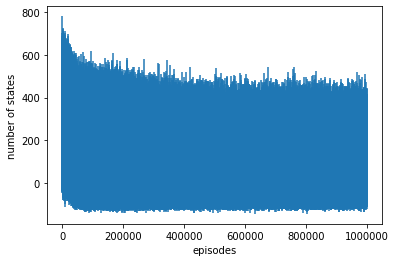

In [5]:
plt.errorbar(range(n_episodes_training),np.mean(train_data[:,0,:],axis=0),yerr=np.std(train_data[:,0,:],axis=0))
plt.xlabel('episodes')
plt.ylabel('number of states')

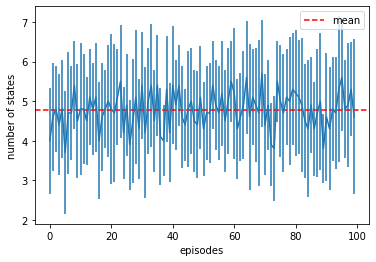

In [8]:
plt.errorbar(range(n_episodes_test),np.mean(test_data[:,0,:],axis=0),yerr=np.std(test_data[:,0,:],axis=0))
plt.xlabel('episodes')
plt.ylabel('number of states')
plt.axhline(np.mean(test_data[:,0,:]),c='red',ls='--',label='mean')
plt.legend()